# Fraud Detection in Electricity and Gas Consumption Challenge

This is a simple starter notebook based on the tutorial prepared by Joy Wawira. Check out the article [here](https://zindi.africa/learn/fraud-detection-in-electricity-and-gas-consumption-challenge-tutorial) for a more detailed description of the steps taken.



# Table of contents
1. [Loading packages and data](#loading_packages_and_data)
3. [EDA](#eda)


<a id='loading_packages_and_data'/>

# Loading packages and data


## Pre-Requisites

In [1]:
DATA_DIR = 'content'

TRAIN_DIR = f'{DATA_DIR}/train'
TEST_DIR = f'{DATA_DIR}/test'

OUTPUT_DIR = f'{DATA_DIR}/output'

def date_unwind(df, datecol):
    df[datecol]  = pd.to_datetime(df[datecol])
    df['year']  = df[datecol].dt.year
    df['month'] = df[datecol].dt.month
    df['day'] = df[datecol].dt.day
    df['day_name'] = df[datecol].dt.day_name()
    df['day_num'] = df[datecol].dt.dayofweek+1
    df['day_of_year'] = df[datecol].dt.dayofyear
    df['month_year'] = df[datecol].dt.to_period('M')
    return df
    
    

## Data Prep

### Import Packages


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import warnings
warnings.simplefilter('ignore')

In [3]:
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, roc_auc_score, roc_curve, RocCurveDisplay, classification_report, recall_score, f1_score, accuracy_score
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
# bin numerical data, scale data, encode data
from sklearn.preprocessing import KBinsDiscretizer, StandardScaler, MinMaxScaler, OneHotEncoder, OrdinalEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.dummy import DummyClassifier

# XGBoost model
#-------------------------------------------------------
import xgboost as xgb
from xgboost import XGBClassifier

# LGBM model
#-------------------------------------------------------
import lightgbm
from lightgbm import LGBMClassifier

### Read the Data

In [4]:
client_train = pd.read_csv(f'{TRAIN_DIR}/client_train.csv', low_memory=False)
invoice_train = pd.read_csv(f'{TRAIN_DIR}/invoice_train.csv', low_memory=False)

invoice_train=invoice_train.query("counter_type=='ELEC'")

client_train.creation_date = pd.to_datetime(client_train.creation_date)
invoice_train=date_unwind(invoice_train, 'invoice_date')
df = pd.merge(invoice_train,client_train, on='client_id', how='left')

del client_train
del invoice_train

df = df.eval("consommation_level_sum=consommation_level_1+consommation_level_2+consommation_level_3+consommation_level_4")

In [5]:
df.shape

(3079406, 29)

<a id='eda'/>

# EDA


In [6]:
df.columns

Index(['client_id', 'invoice_date', 'tarif_type', 'counter_number',
       'counter_statue', 'counter_code', 'reading_remarque',
       'counter_coefficient', 'consommation_level_1', 'consommation_level_2',
       'consommation_level_3', 'consommation_level_4', 'old_index',
       'new_index', 'months_number', 'counter_type', 'year', 'month', 'day',
       'day_name', 'day_num', 'day_of_year', 'month_year', 'disrict',
       'client_catg', 'region', 'creation_date', 'target',
       'consommation_level_sum'],
      dtype='object')

In [7]:
df.dtypes

client_id                         object
invoice_date              datetime64[ns]
tarif_type                         int64
counter_number                     int64
counter_statue                    object
counter_code                       int64
reading_remarque                   int64
counter_coefficient                int64
consommation_level_1               int64
consommation_level_2               int64
consommation_level_3               int64
consommation_level_4               int64
old_index                          int64
new_index                          int64
months_number                      int64
counter_type                      object
year                               int32
month                              int32
day                                int32
day_name                          object
day_num                            int32
day_of_year                        int32
month_year                     period[M]
disrict                            int64
client_catg     

In [8]:
df.groupby('target')['invoice_date'].min()

target
0.0   1977-06-09
1.0   2005-01-07
Name: invoice_date, dtype: datetime64[ns]

In [9]:
(df['invoice_date']<'2005-01-07').value_counts()

invoice_date
False    3059475
True       19931
Name: count, dtype: int64

In [10]:
print(f"Only {round((df['invoice_date']<'2005-01-07').value_counts()[1]/( (df['invoice_date']<'2005-01-07').value_counts()[0]+(df['invoice_date']<'2005-01-07').value_counts()[1] )*100, 3)}% of all the records are from before 2005-01-07.")
print("Also, no frauds were detected or recorded before that time.")
print(f"Finally, the data is very unbalanced, since only {round(df.groupby('client_id')['target'].mean().value_counts()[1]/( df.groupby('client_id')['target'].mean().value_counts()[0] +df.groupby('client_id')['target'].mean().value_counts()[1])*100,3)}% of all clients are associated with fraudulent behavior.")

Only 0.647% of all the records are from before 2005-01-07.
Also, no frauds were detected or recorded before that time.
Finally, the data is very unbalanced, since only 5.608% of all clients are associated with fraudulent behavior.


<Axes: xlabel='year', ylabel='Count'>

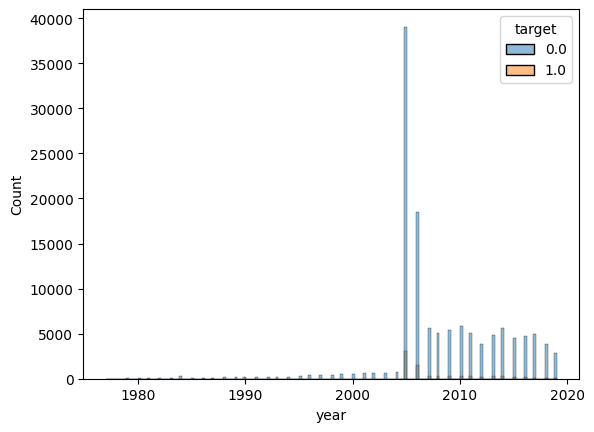

In [11]:
sns.histplot(df.groupby('client_id').agg({'year':'min', 'target':'mean'}), x='year', hue='target')

In [12]:
df = df.query("invoice_date>= '2005-01-07'")

In [13]:
print("Who are the fraudsters and where do they come from?")

Who are the fraudsters and where do they come from?


In [14]:
df['disrict'].unique()

array([60, 69, 62, 63])

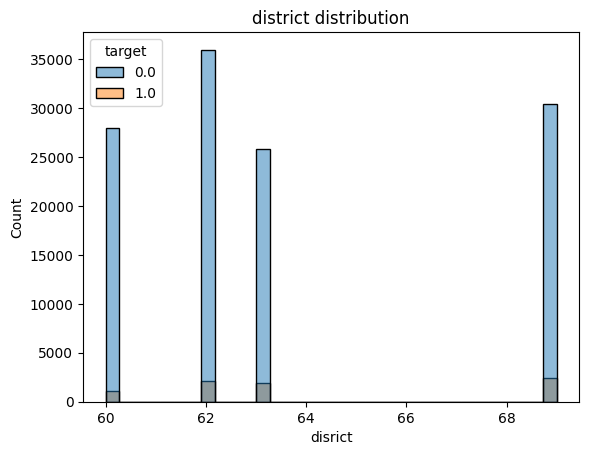

In [15]:
sns.histplot(df.groupby('client_id').agg({'disrict':'mean', 'target':'mean'}), x='disrict', hue='target')
plt.title('district distribution')
plt.show()

In [16]:
df['region'].unique()

array([101, 107, 301, 105, 303, 103, 309, 311, 304, 104, 312, 305, 306,
       308, 372, 307, 313, 310, 371, 302, 106, 379, 399, 206])

In [17]:
df_regions_and_targets = df.groupby('client_id').agg({'region':'mean', 'target':'mean'})

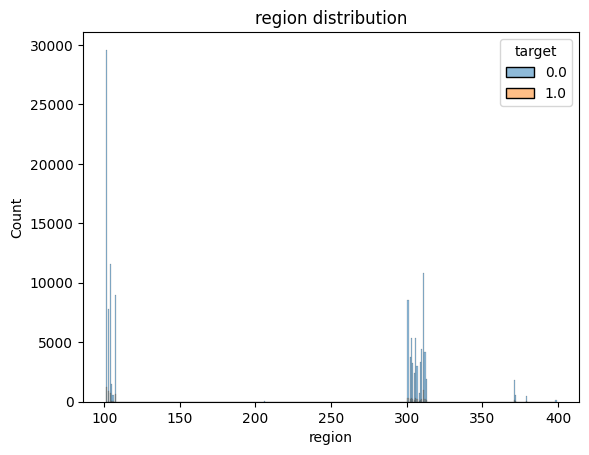

In [18]:
sns.histplot(df_regions_and_targets, x='region', hue='target', bins=df['region'].max())
plt.title('region distribution')
#plt.yscale('log')
plt.show()

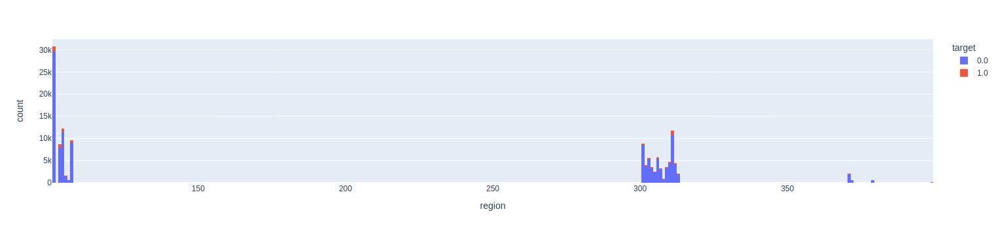

In [19]:
px.histogram(df_regions_and_targets, x='region', color='target', nbins=int(df['region'].max()))


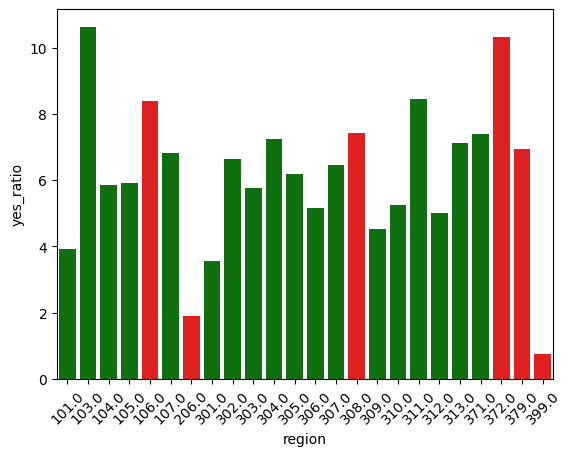

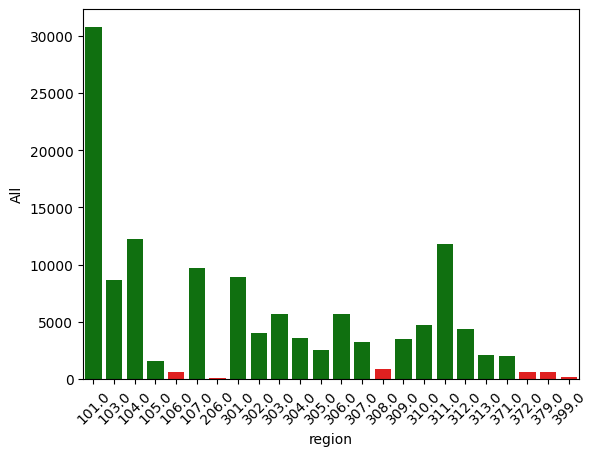

In [20]:
df_regions_VS_targets = pd.crosstab(df_regions_and_targets['region'],df_regions_and_targets['target']).rename(columns={0.0:'no', 1.0:'yes'}).eval("yes_ratio=yes/(yes+no)*100").eval("All = yes+no")

cols = ['red' if x < 1000 else 'green' for x in df_regions_VS_targets.All]



sns.barplot(df_regions_VS_targets.reset_index(), x='region', y='yes_ratio', palette=cols)
plt.xticks(rotation=45)

plt.show()

sns.barplot(df_regions_VS_targets.reset_index(), x='region', y='All', palette=cols)
plt.xticks(rotation=45)

plt.show()



In [21]:
print("There are regions where fraud occurs at a relatively high rate just as there are regions where fraudulant behavior seems to be not that common. Can this be attributed to the wealth of that particular region?")

# note: calculate avergare consommation_level as function of region to determine a region's wealth. Does it correlate with the fraud ("yes_ratio"?)

There are regions where fraud occurs at a relatively high rate just as there are regions where fraudulant behavior seems to be not that common. Can this be attributed to the wealth of that particular region?


In [22]:
#df = df.eval("consommation_level_sum=consommation_level_1+consommation_level_2+consommation_level_3+consommation_level_4")

In [23]:
df_regions_VS_targets_consommation = pd.merge(df_regions_VS_targets,df.groupby('region').agg({'consommation_level_sum':'mean'}), left_index=True, right_index=True )

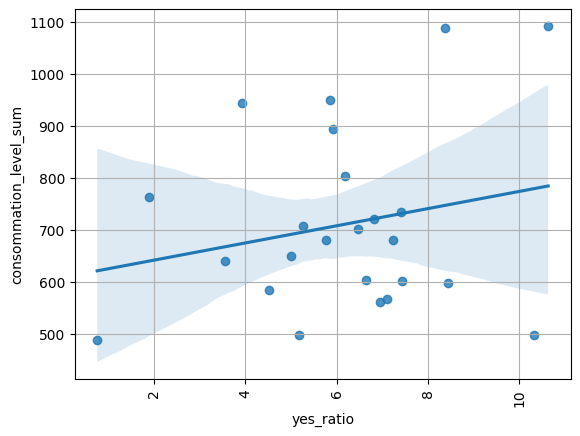

In [24]:

sns.regplot(df_regions_VS_targets_consommation, x='yes_ratio', y='consommation_level_sum')
plt.grid()
plt.xticks(rotation=90)

plt.show()


In [25]:
print("Contrary to the above assumption, the fraction of fraudsters within the clientele is higher in regions where the consommation is also higher! This would imply that people who commit gas- or electricity-fraud are likely to also have a higher consumption compared to the honest consumers.")

Contrary to the above assumption, the fraction of fraudsters within the clientele is higher in regions where the consommation is also higher! This would imply that people who commit gas- or electricity-fraud are likely to also have a higher consumption compared to the honest consumers.


In [26]:
df.query("target == 1").groupby(['invoice_date'])[['consommation_level_sum']].mean().rolling(window=30, min_periods=0).mean().reset_index()

,invoice_date,consommation_level_sum
0,2005-01-07,304.000000
1,2005-01-08,354.583333
2,2005-01-11,408.891236
3,2005-01-12,427.673636
4,2005-02-08,531.894464
...,...,...
3276,2019-12-02,1103.503375
3277,2019-12-03,1110.710812
3278,2019-12-04,1110.109537
3279,2019-12-06,1092.408947


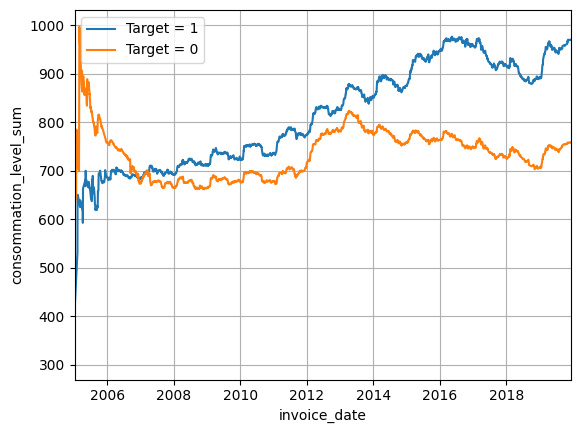

In [27]:

sns.lineplot(df.query("target == 1").groupby(['invoice_date'])[['consommation_level_sum']].mean().rolling(window=365, min_periods=0).mean().reset_index(), x='invoice_date', y='consommation_level_sum', label='Target = 1')
sns.lineplot(df.query("target == 0").groupby(['invoice_date'])[['consommation_level_sum']].mean().rolling(window=365, min_periods=0).mean().reset_index(), x='invoice_date', y='consommation_level_sum', label='Target = 0')
plt.xlim([df.query("target == 1")['invoice_date'].min(),df.query("target == 1")['invoice_date'].max()])
#plt.ylim([500,750])

plt.grid()
plt.legend()

In [28]:
print("The consommation level, averaged over time and clients, shows a vastly different energy consumption behavior between clients that commit fraud and those who don't: In the case of the honest clients, the overall consumption decreases in the span of the last decade and more. In the same time, the fraudsters increased their consumption gradually. This leads to a big gab between those two groups culminating in the years 2015 to 2018, where the fraudsters consumed almost 25% more energy than the honest clients.")

The consommation level, averaged over time and clients, shows a vastly different energy consumption behavior between clients that commit fraud and those who don't: In the case of the honest clients, the overall consumption decreases in the span of the last decade and more. In the same time, the fraudsters increased their consumption gradually. This leads to a big gab between those two groups culminating in the years 2015 to 2018, where the fraudsters consumed almost 25% more energy than the honest clients.


In [29]:
df.sample(10)

,client_id,invoice_date,tarif_type,counter_number,counter_statue,counter_code,reading_remarque,counter_coefficient,consommation_level_1,consommation_level_2,...,day_name,day_num,day_of_year,month_year,disrict,client_catg,region,creation_date,target,consommation_level_sum
1744422,train_Client_47102,2007-09-10,11,350393,0,203,6,1,430,0,...,Monday,1,253,2007-09,62,11,301,1999-05-17,0.0,430
2289314,train_Client_68742,2015-04-17,11,142761,0,413,9,1,800,400,...,Friday,5,107,2015-04,69,11,104,2006-05-29,0.0,1657
811081,train_Client_132054,2013-04-12,11,1052467,0,203,6,1,381,0,...,Friday,5,102,2013-04,62,11,309,2006-07-28,0.0,381
899008,train_Client_13598,2014-05-26,11,27145,0,203,8,1,717,0,...,Monday,1,146,2014-05,69,11,105,2010-12-21,0.0,717
1833968,train_Client_50643,2016-11-07,11,21624,0,203,9,1,200,100,...,Monday,1,312,2016-11,62,11,301,2014-11-12,1.0,545
2788169,train_Client_88405,2017-05-06,11,549313,0,413,8,1,61,0,...,Saturday,6,126,2017-05,69,11,107,2010-09-22,0.0,61
1238305,train_Client_27067,2011-06-07,11,1247361,0,203,6,1,416,0,...,Tuesday,2,158,2011-06,60,11,101,1993-11-12,0.0,416
1395825,train_Client_3329,2013-11-13,11,140142,0,413,9,1,2400,6343,...,Wednesday,3,317,2013-11,60,11,101,2010-10-21,0.0,8743
2725914,train_Client_85960,2007-08-10,11,344789,0,203,6,1,126,0,...,Friday,5,222,2007-08,69,11,107,1983-10-03,0.0,126
1201305,train_Client_25605,2019-07-18,11,27161134988400,0,203,9,1,445,0,...,Thursday,4,199,2019-07,63,11,312,2016-12-06,0.0,445


In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3059475 entries, 0 to 3079402
Data columns (total 29 columns):
 #   Column                  Dtype         
---  ------                  -----         
 0   client_id               object        
 1   invoice_date            datetime64[ns]
 2   tarif_type              int64         
 3   counter_number          int64         
 4   counter_statue          object        
 5   counter_code            int64         
 6   reading_remarque        int64         
 7   counter_coefficient     int64         
 8   consommation_level_1    int64         
 9   consommation_level_2    int64         
 10  consommation_level_3    int64         
 11  consommation_level_4    int64         
 12  old_index               int64         
 13  new_index               int64         
 14  months_number           int64         
 15  counter_type            object        
 16  year                    int32         
 17  month                   int32         
 18  day    

In [31]:
df.select_dtypes(include=['object']).head(10)

,client_id,counter_statue,counter_type,day_name
0,train_Client_0,0,ELEC,Monday
1,train_Client_0,0,ELEC,Friday
2,train_Client_0,0,ELEC,Monday
3,train_Client_0,0,ELEC,Monday
4,train_Client_0,0,ELEC,Thursday
5,train_Client_0,0,ELEC,Monday
6,train_Client_0,0,ELEC,Friday
7,train_Client_0,0,ELEC,Tuesday
8,train_Client_0,0,ELEC,Friday
9,train_Client_0,0,ELEC,Tuesday


My first strategy for finding fraudulent clients is to group the available data by the clients and classify the clients based on varius aggregates of the data.


Lets define the model first, so we can use it to quickly test our method. We use LGBM, because it offers a good compromise between speed and reliability or accuracy. We set the hyperparameter `scale_pos_weight` to 16, i.e. the ratio between the number of 0s and 1s in the target column (total number of examples in the majority class divided by the total number of examples in the minority class), so the weights associated with the classes are rescaled to compensate for the imbalance of the data.

In [32]:
df['counter_statue'] = df['counter_statue'].replace('A', 8).astype('int')
df['tarif_type'] = df['tarif_type'].astype('int')
df['counter_code'] = df['counter_code'].astype('int')
df['reading_remarque'] = df['reading_remarque'].astype('int')

In [33]:
#df['counter_statue']= df['counter_statue'].map({0:0,1:1,2:2,3:3,4:4,5:5,618:6,769:7, 8:8, 46:9})
#df['reading_remarque']= df['reading_remarque'].map({6:6,7:7,8:8,9:9, 207:5, 413:4, 203:3})

In [34]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3059475 entries, 0 to 3079402
Data columns (total 29 columns):
 #   Column                  Dtype         
---  ------                  -----         
 0   client_id               object        
 1   invoice_date            datetime64[ns]
 2   tarif_type              int64         
 3   counter_number          int64         
 4   counter_statue          int64         
 5   counter_code            int64         
 6   reading_remarque        int64         
 7   counter_coefficient     int64         
 8   consommation_level_1    int64         
 9   consommation_level_2    int64         
 10  consommation_level_3    int64         
 11  consommation_level_4    int64         
 12  old_index               int64         
 13  new_index               int64         
 14  months_number           int64         
 15  counter_type            object        
 16  year                    int32         
 17  month                   int32         
 18  day    

In [121]:
def run_model(df):
    X = df.drop(['client_id', 'target'], axis=1)
    y = df['target']
    X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=777, test_size=0.2)
    lgbm_model = LGBMClassifier(scale_pos_weight=16)
    lgbm_model.fit(X_train, y_train)
    y_pred = lgbm_model.predict(X_test)
    
    print('accuracy: ', accuracy_score(y_test, y_pred))
    print('recall: ', recall_score(y_test, y_pred))
    print('f1: ', f1_score(y_test, y_pred))
    print('roc_auc: ',roc_auc_score(y_test, y_pred))
    ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred)).plot()



Lets start with the simpleset case: just the sum of all consumed electricity

In [36]:
aggs={
      'consommation_level_sum':'sum',
      'target':pd.Series.mode, 
     }


df_agg = df.groupby('client_id').agg(aggs).reset_index()

In [37]:
df_agg.head(1)

,client_id,consommation_level_sum,target
0,train_Client_0,12704,0.0


[LightGBM] [Info] Number of positive: 6048, number of negative: 96144
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001059 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 255
[LightGBM] [Info] Number of data points in the train set: 102192, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.059183 -> initscore=-2.766119
[LightGBM] [Info] Start training from score -2.766119
accuracy:  0.4774933458587756
recall:  0.7764550264550265
f1:  0.14958272281327642
roc_auc:  0.617570998000354


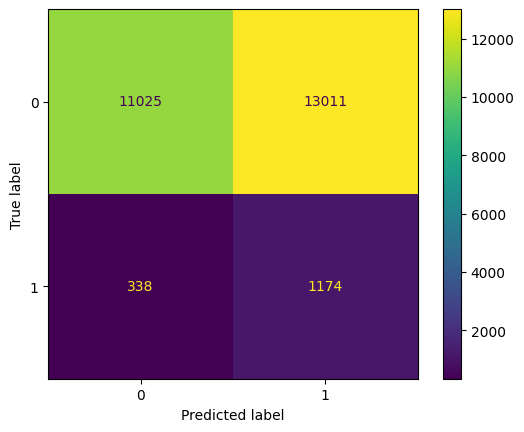

In [38]:
run_model(df_agg)

In [39]:
aggs={
      'consommation_level_sum':['sum','min','max'],
      'target':pd.Series.mode, 
     }


df_agg = df.groupby('client_id').agg(aggs).reset_index()

df_agg.columns = ["_".join(a) for a in df_agg.columns.to_flat_index()]


df_agg = df_agg.rename(columns={'client_id_':'client_id','target_mode':'target'})

In [40]:
df_agg.head(1)

,client_id,consommation_level_sum_sum,consommation_level_sum_min,consommation_level_sum_max,target
0,train_Client_0,12704,38,1386,0.0


[LightGBM] [Info] Number of positive: 6048, number of negative: 96144
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001610 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 102192, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.059183 -> initscore=-2.766119
[LightGBM] [Info] Start training from score -2.766119
accuracy:  0.5879520901831846
recall:  0.7156084656084656
f1:  0.1705145378614766
roc_auc:  0.6477651247995733


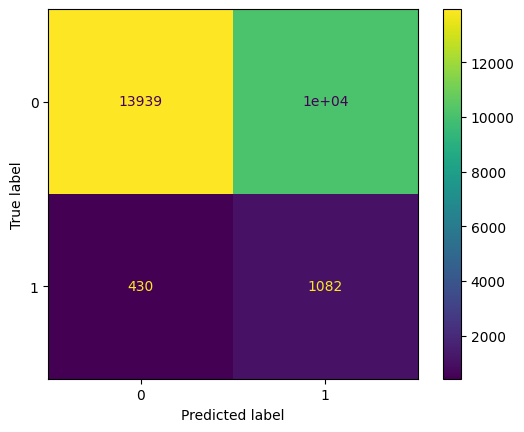

In [41]:
run_model(df_agg)

[LightGBM] [Info] Number of positive: 6048, number of negative: 96144
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001090 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1426
[LightGBM] [Info] Number of data points in the train set: 102192, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.059183 -> initscore=-2.766119
[LightGBM] [Info] Start training from score -2.766119
accuracy:  0.6274072334429309
recall:  0.701058201058201
f1:  0.18214623249420053
roc_auc:  0.6619161865667107


,client_id,consommation_level_sum_sum,consommation_level_sum_mean,consommation_level_sum_median,consommation_level_sum_min,consommation_level_sum_max,consommation_level_sum_count,target
0,train_Client_0,12704,362.971429,267.0,38,1386,35,0.0
1,train_Client_1,20629,557.540541,520.0,190,1207,37,0.0
2,train_Client_10,15057,836.500000,655.5,188,3082,18,0.0


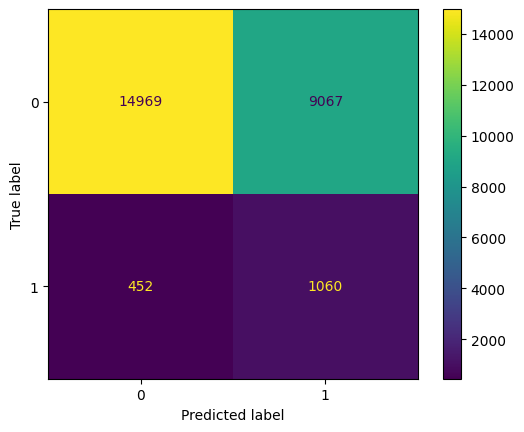

In [42]:
aggs={
      'consommation_level_sum':['sum','mean','median','min','max','count'],
      'target':pd.Series.mode, 
     }


df_agg = df.groupby('client_id').agg(aggs).reset_index()

df_agg.columns = ["_".join(a) for a in df_agg.columns.to_flat_index()]


df_agg = df_agg.rename(columns={'client_id_':'client_id','target_mode':'target'})


run_model(df_agg)

df_agg.head(3)

In [43]:
df.columns

Index(['client_id', 'invoice_date', 'tarif_type', 'counter_number',
       'counter_statue', 'counter_code', 'reading_remarque',
       'counter_coefficient', 'consommation_level_1', 'consommation_level_2',
       'consommation_level_3', 'consommation_level_4', 'old_index',
       'new_index', 'months_number', 'counter_type', 'year', 'month', 'day',
       'day_name', 'day_num', 'day_of_year', 'month_year', 'disrict',
       'client_catg', 'region', 'creation_date', 'target',
       'consommation_level_sum'],
      dtype='object')

[LightGBM] [Info] Number of positive: 6048, number of negative: 96144
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001492 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1456
[LightGBM] [Info] Number of data points in the train set: 102192, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.059183 -> initscore=-2.766119
[LightGBM] [Info] Start training from score -2.766119
accuracy:  0.6702677313292625
recall:  0.6792328042328042
f1:  0.19602977667493796
roc_auc:  0.6744682909498186


Index(['client_id', 'consommation_level_sum_sum',
       'consommation_level_sum_mean', 'consommation_level_sum_median',
       'consommation_level_sum_min', 'consommation_level_sum_max',
       'consommation_level_sum_count', 'target', 'disrict_mode',
       'region_mode'],
      dtype='object')

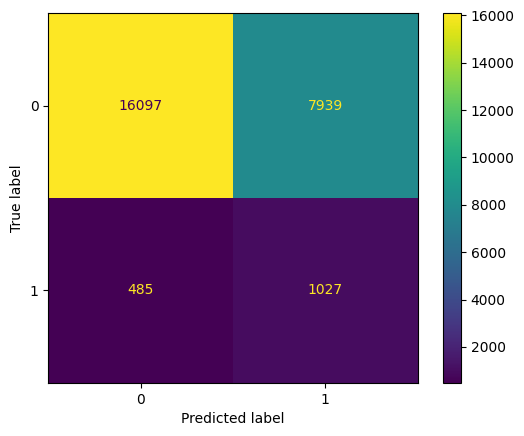

In [44]:
aggs={
      'consommation_level_sum':['sum','mean','median','min','max','count'],
      'target':pd.Series.mode, 
      'disrict':pd.Series.mode,
      'region':pd.Series.mode, 
     }


df_agg = df.groupby('client_id').agg(aggs).reset_index()

df_agg.columns = ["_".join(a) for a in df_agg.columns.to_flat_index()]


df_agg = df_agg.rename(columns={'client_id_':'client_id','target_mode':'target'})


run_model(df_agg)

df_agg.columns

[LightGBM] [Info] Number of positive: 6048, number of negative: 96144
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002659 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2790
[LightGBM] [Info] Number of data points in the train set: 102192, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.059183 -> initscore=-2.766119
[LightGBM] [Info] Start training from score -2.766119
accuracy:  0.6932440895569125
recall:  0.6792328042328042
f1:  0.2076635325042968
roc_auc:  0.6866791413408987


Index(['client_id', 'consommation_level_sum_sum_x',
       'consommation_level_sum_mean_x', 'consommation_level_sum_median_x',
       'consommation_level_sum_min_x', 'consommation_level_sum_max_x',
       'consommation_level_sum_count_x', 'target', 'disrict_mode',
       'region_mode', 'consommation_level_sum_sum_y',
       'consommation_level_sum_mean_y', 'consommation_level_sum_median_y',
       'consommation_level_sum_min_y', 'consommation_level_sum_max_y',
       'consommation_level_sum_count_y'],
      dtype='object')

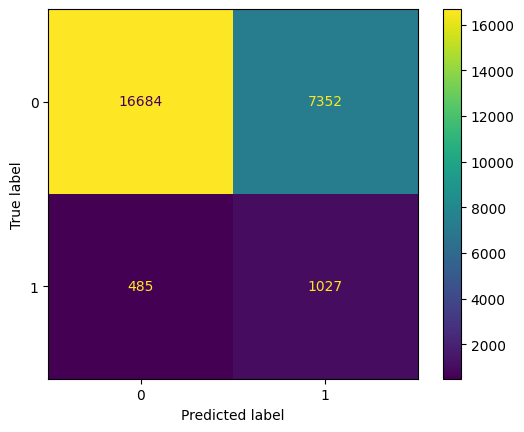

In [45]:
aggs1={
      'consommation_level_sum':['sum','mean','median','min','max','count'],
      'target':pd.Series.mode, 
      'disrict':pd.Series.mode,
      'region':pd.Series.mode, 
     }


df_agg1 = df.groupby('client_id').agg(aggs1).reset_index()

df_agg1.columns = ["_".join(a) for a in df_agg1.columns.to_flat_index()]


aggs2={
      'consommation_level_sum':['sum','mean','median','min','max','count'],
      'target':pd.Series.mode, 
     }


df_agg2 = df.query("year>=2015 & year<=2018").groupby('client_id').agg(aggs2).reset_index()

df_agg2.columns = ["_".join(a) for a in df_agg2.columns.to_flat_index()]


df_agg = pd.merge(df_agg1, df_agg2, on='client_id_', how='left').fillna(0)
df_agg = df_agg.drop(['target_mode_y'], axis=1)
df_agg = df_agg.rename(columns={'client_id_':'client_id','target_mode_x':'target'})




run_model(df_agg)

df_agg.columns





[LightGBM] [Info] Number of positive: 6048, number of negative: 96144
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002852 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3022
[LightGBM] [Info] Number of data points in the train set: 102192, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.059183 -> initscore=-2.766119
[LightGBM] [Info] Start training from score -2.766119
accuracy:  0.6973540003131361
recall:  0.6851851851851852
f1:  0.21134230926152592
roc_auc:  0.6916523363103493


Index(['client_id', 'consommation_level_sum_sum_x',
       'consommation_level_sum_mean_x', 'consommation_level_sum_median_x',
       'consommation_level_sum_min_x', 'consommation_level_sum_max_x',
       'consommation_level_sum_count_x', 'target', 'disrict_mode',
       'region_mode', 'counter_statue_mean', 'consommation_level_sum_sum_y',
       'consommation_level_sum_mean_y', 'consommation_level_sum_median_y',
       'consommation_level_sum_min_y', 'consommation_level_sum_max_y',
       'consommation_level_sum_count_y'],
      dtype='object')

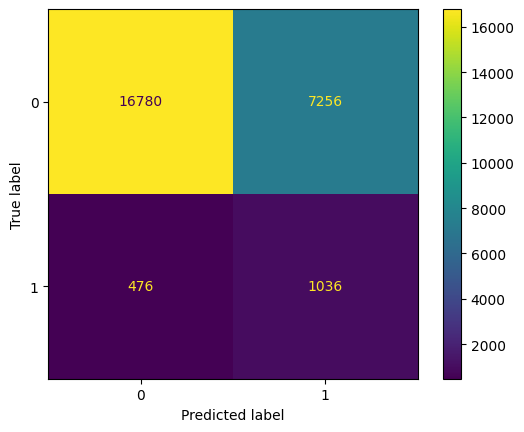

In [46]:
aggs1={
      'consommation_level_sum':['sum','mean','median','min','max','count'],
      'target':pd.Series.mode, 
      'disrict':pd.Series.mode,
      'region':pd.Series.mode, 
      'counter_statue':pd.Series.mean, 
     }


df_agg1 = df.groupby('client_id').agg(aggs1).reset_index()

df_agg1.columns = ["_".join(a) for a in df_agg1.columns.to_flat_index()]


aggs2={
      'consommation_level_sum':['sum','mean','median','min','max','count'],
      'target':pd.Series.mode, 
     }


df_agg2 = df.query("year>=2015 & year<=2018").groupby('client_id').agg(aggs2).reset_index()

df_agg2.columns = ["_".join(a) for a in df_agg2.columns.to_flat_index()]


df_agg = pd.merge(df_agg1, df_agg2, on='client_id_', how='left').fillna(0)
df_agg = df_agg.drop(['target_mode_y'], axis=1)
df_agg = df_agg.rename(columns={'client_id_':'client_id','target_mode_x':'target'})




run_model(df_agg)

df_agg.columns





[LightGBM] [Info] Number of positive: 6048, number of negative: 96144
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005362 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3267
[LightGBM] [Info] Number of data points in the train set: 102192, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.059183 -> initscore=-2.766119
[LightGBM] [Info] Start training from score -2.766119
accuracy:  0.7116799749491154
recall:  0.6858465608465608
f1:  0.2197033898305085
roc_auc:  0.6995758016414532


Index(['client_id', 'consommation_level_sum_sum_x',
       'consommation_level_sum_mean_x', 'consommation_level_sum_median_x',
       'consommation_level_sum_min_x', 'consommation_level_sum_max_x',
       'consommation_level_sum_count_x', 'target', 'disrict_mode',
       'region_mode', 'counter_statue_mean', 'tarif_type_mean',
       'consommation_level_sum_sum_y', 'consommation_level_sum_mean_y',
       'consommation_level_sum_median_y', 'consommation_level_sum_min_y',
       'consommation_level_sum_max_y', 'consommation_level_sum_count_y'],
      dtype='object')

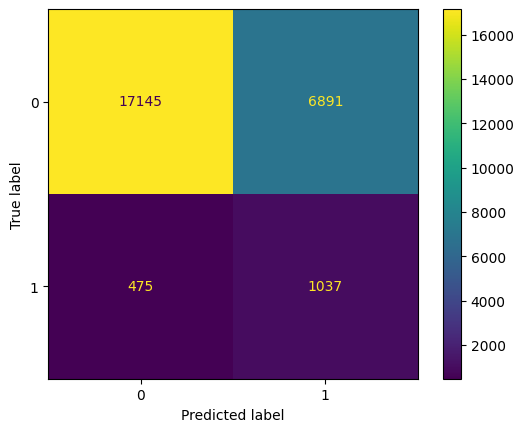

In [47]:
aggs1={
      'consommation_level_sum':['sum','mean','median','min','max','count'],
      'target':pd.Series.mode, 
      'disrict':pd.Series.mode,
      'region':pd.Series.mode, 
      'counter_statue':pd.Series.mean, 
      'tarif_type':pd.Series.mean, 
     }


df_agg1 = df.groupby('client_id').agg(aggs1).reset_index()

df_agg1.columns = ["_".join(a) for a in df_agg1.columns.to_flat_index()]


aggs2={
      'consommation_level_sum':['sum','mean','median','min','max','count'],
      'target':pd.Series.mode, 
     }


df_agg2 = df.query("year>=2015 & year<=2018").groupby('client_id').agg(aggs2).reset_index()

df_agg2.columns = ["_".join(a) for a in df_agg2.columns.to_flat_index()]


df_agg = pd.merge(df_agg1, df_agg2, on='client_id_', how='left').fillna(0)
df_agg = df_agg.drop(['target_mode_y'], axis=1)
df_agg = df_agg.rename(columns={'client_id_':'client_id','target_mode_x':'target'})




run_model(df_agg)

df_agg.columns





[LightGBM] [Info] Number of positive: 6048, number of negative: 96144
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005196 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3762
[LightGBM] [Info] Number of data points in the train set: 102192, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.059183 -> initscore=-2.766119
[LightGBM] [Info] Start training from score -2.766119
accuracy:  0.7337952090183184
recall:  0.7182539682539683
f1:  0.24205951186894017
roc_auc:  0.7265134044964299


Index(['client_id', 'consommation_level_sum_sum_x',
       'consommation_level_sum_mean_x', 'consommation_level_sum_median_x',
       'consommation_level_sum_min_x', 'consommation_level_sum_max_x',
       'consommation_level_sum_count_x', 'target', 'disrict_mode',
       'region_mode', 'counter_statue_mean', 'tarif_type_mean',
       'counter_code_mean', 'reading_remarque_mean',
       'consommation_level_sum_sum_y', 'consommation_level_sum_mean_y',
       'consommation_level_sum_median_y', 'consommation_level_sum_min_y',
       'consommation_level_sum_max_y', 'consommation_level_sum_count_y'],
      dtype='object')

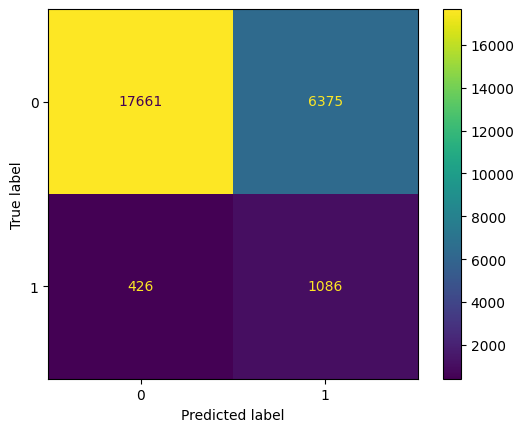

In [48]:
aggs1={
      'consommation_level_sum':['sum','mean','median','min','max','count'],
      'target':pd.Series.mode, 
      'disrict':pd.Series.mode,
      'region':pd.Series.mode, 
      'counter_statue':pd.Series.mean, 
      'tarif_type':pd.Series.mean, 
      'counter_code':pd.Series.mean,
      'reading_remarque':pd.Series.mean,
     }


df_agg1 = df.groupby('client_id').agg(aggs1).reset_index()

df_agg1.columns = ["_".join(a) for a in df_agg1.columns.to_flat_index()]


aggs2={
      'consommation_level_sum':['sum','mean','median','min','max','count'],
     }
df_agg2 = df.query("year>=2015 & year<=2018").groupby('client_id').agg(aggs2).reset_index()
df_agg2.columns = ["_".join(a) for a in df_agg2.columns.to_flat_index()]
df_agg = pd.merge(df_agg1, df_agg2, on='client_id_', how='left').fillna(0)

df_agg = df_agg.rename(columns={'client_id_':'client_id','target_mode':'target'})




run_model(df_agg)

df_agg.columns





In [ ]:
#import scipy
#volat={}
#
#for client in df['client_id'].unique():
#    msd=[]
#
#    
#    if len(df.query('client_id==@client')) <= 3:
#        volat[client]=df.query('client_id==@client').reset_index()['consommation_level_sum'].mean()
#    if len(df.query('client_id==@client')) > 3:    
#        for dt in range(len(df.query('client_id==@client'))//2):
#            msd.append((df.query('client_id==@client').reset_index()['consommation_level_sum'].cumsum().diff(dt)**2).mean()**0.5)
#        
#        my_y = msd
#        my_x = range(len(msd))
#
#
#
#        slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(my_x, my_y)
#        volat[client]=slope
#        
#df_volat = pd.DataFrame(volat.items(), columns=['client_id', 'volatility'])

[LightGBM] [Info] Number of positive: 6048, number of negative: 96144
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009381 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4017
[LightGBM] [Info] Number of data points in the train set: 102192, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.059183 -> initscore=-2.766119
[LightGBM] [Info] Start training from score -2.766119
accuracy:  0.7375136997025208
recall:  0.7202380952380952
f1:  0.24515983791085097
roc_auc:  0.7294192639612012


Index(['client_id', 'consommation_level_sum_sum_x',
       'consommation_level_sum_mean_x', 'consommation_level_sum_median_x',
       'consommation_level_sum_min_x', 'consommation_level_sum_max_x',
       'consommation_level_sum_count_x', 'target', 'disrict_mode',
       'region_mode', 'counter_statue_mean', 'tarif_type_mean',
       'counter_code_mean', 'reading_remarque_mean',
       'consommation_level_sum_sum_y', 'consommation_level_sum_mean_y',
       'consommation_level_sum_median_y', 'consommation_level_sum_min_y',
       'consommation_level_sum_max_y', 'consommation_level_sum_count_y',
       'volatility'],
      dtype='object')

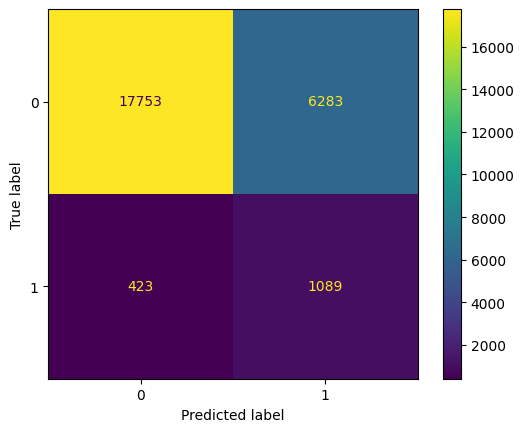

In [70]:
aggs1={
      'consommation_level_sum':['sum','mean','median','min','max','count'],
      'target':pd.Series.mode, 
      'disrict':pd.Series.mode,
      'region':pd.Series.mode, 
      'counter_statue':pd.Series.mean, 
      'tarif_type':pd.Series.mean, 
      'counter_code':pd.Series.mean,
      'reading_remarque':pd.Series.mean,
     }


df_agg1 = df.groupby('client_id').agg(aggs1).reset_index()

df_agg1.columns = ["_".join(a) for a in df_agg1.columns.to_flat_index()]


aggs2={
      'consommation_level_sum':['sum','mean','median','min','max','count'],
     }
df_agg2 = df.query("year>=2015 & year<=2018").groupby('client_id').agg(aggs2).reset_index()
df_agg2.columns = ["_".join(a) for a in df_agg2.columns.to_flat_index()]
df_agg = pd.merge(df_agg1, df_agg2, on='client_id_', how='left').fillna(0)

df_agg = df_agg.rename(columns={'client_id_':'client_id','target_mode':'target'})








df_volat = pd.read_csv('volatility.csv', index_col='index')
df_volat.index.name=None
df_volat['client_id'] = 'train_Client_' + df_volat['client_id'].astype(str)
df_agg = pd.merge(df_agg, df_volat, on='client_id', how='left')







run_model(df_agg)

df_agg.columns





[LightGBM] [Info] Number of positive: 6048, number of negative: 96144
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007642 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4017
[LightGBM] [Info] Number of data points in the train set: 102192, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.059183 -> initscore=-2.766119
[LightGBM] [Info] Start training from score -2.766119
accuracy:  0.7375136997025208
recall:  0.7202380952380952
f1:  0.24515983791085097
roc_auc:  0.7294192639612012


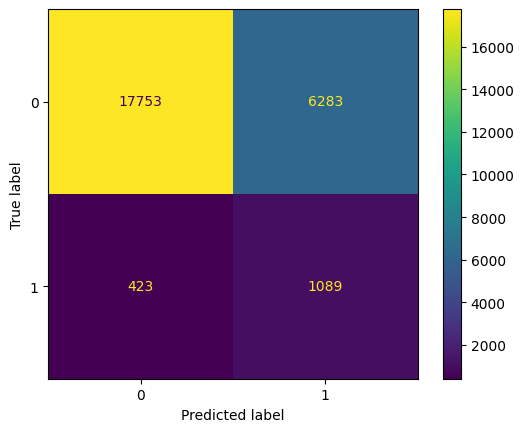

In [122]:
run_model(df_agg)

In [115]:
%%time
# Import 'GridSearchCV', 'make_scorer', and any other necessary libraries
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import make_scorer 
from scipy.stats import uniform, truncnorm, randint

# Create the parameters list you wish to tune
parameters = {'n_estimators':randint(0, 1000),
              'num_leaves': randint(2, 512),
              'max_depth': randint(2, 128),
              'learning_rate':uniform(0.001, 0.15),
              'min_split_gain': uniform(0.001, 0.1),
              'feature_fraction': uniform(0.1, 1.0),
              'bagging_freq': randint(1,10),
              'verbosity': [-1],
              'random_state':[777],
              'scale_pos_weight':[16]
             } 

# Make an fbeta_score scoring object
scorer = make_scorer(roc_auc_score) 


X = df_agg.drop(['client_id', 'target'], axis=1)
y = df_agg['target']
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=777, test_size=0.2)

lgbm_model = LGBMClassifier(scale_pos_weight=16)
# TODO: Perform grid search on the classifier using 'scorer' as the scoring method
gridsearch = RandomizedSearchCV(lgbm_model, param_distributions = parameters, cv=2, n_iter=1500, scoring=scorer)

# TODO: Fit the grid search object to the training data and find the optimal parameters

gridsearch.fit(X_train, y_train)


[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /tmp/pip-install-980pbj3x/lightgbm_3ba115fcc85344d4af4dd9a6e1e7ec36/src/io/config_auto.cpp, line 381 .

[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /tmp/pip-install-980pbj3x/lightgbm_3ba115fcc85344d4af4dd9a6e1e7ec36/src/io/config_auto.cpp, line 381 .

[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /tmp/pip-install-980pbj3x/lightgbm_3ba115fcc85344d4af4dd9a6e1e7ec36/src/io/config_auto.cpp, line 381 .

[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /tmp/pip-install-980pbj3x/lightgbm_3ba115fcc85344d4af4dd9a6e1e7ec36/src/io/config_auto.cpp, line 381 .

[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /tmp/pip-install-980pbj3x/lightgbm_3ba115fcc85344d4af4dd9a6e1e7ec36/src/io/config_auto.cpp, line 381 .

[LightGBM] [Fatal] Check failed: (feature_fraction) <= (1.0) at /tmp/pip-install-980pbj3x/lightgbm_3ba115fcc85344d4af4dd9a6e1e7ec36/src/io/config_auto.cpp, line

CPU times: user 9h 51min 53s, sys: 10min 5s, total: 10h 1min 59s
Wall time: 5h 3min 31s


RandomizedSearchCV(cv=2, estimator=LGBMClassifier(scale_pos_weight=16),
                   n_iter=1500,
                   param_distributions={'bagging_freq': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7ff10c1a8bd0>,
                                        'feature_fraction': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x7ff10c1a8250>,
                                        'learning_rate': <scipy.stats._distn_infrastructure.rv_con...
                                        'min_split_gain': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x7ff10c1a9b50>,
                                        'n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7ff10e23f110>,
                                        'num_leaves': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7ff10c3fab50>,
                                        'random_state': [777],
                                        'scale_pos_weight': [16],
                                        'verbosity': [-1]},
                   scoring=make_scorer(roc_auc_score))

In [116]:
gridsearch.best_score_

0.7177289621123869

In [117]:
gridsearch.best_params_

{'bagging_freq': 6,
 'feature_fraction': 0.7425574423360857,
 'learning_rate': 0.11287190128324238,
 'max_depth': 2,
 'min_split_gain': 0.021206451494151304,
 'n_estimators': 573,
 'num_leaves': 209,
 'random_state': 777,
 'scale_pos_weight': 16,
 'verbosity': -1}

In [65]:
def run_model(df):
    X = df.drop(['client_id', 'target'], axis=1)
    y = df['target']
    X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=777, test_size=0.2)
    lgbm_model = LGBMClassifier(bagging_freq= 6,
                                feature_fraction= 0.7425574423360857,
                                learning_rate= 0.11287190128324238,
                                max_depth= 2,
                                min_split_gain= 0.021206451494151304,
                                n_estimators= 573,
                                num_leaves= 209,
                                random_state= 777,
                                scale_pos_weight= 16,
                                verbosity= -1)
    lgbm_model.fit(X_train, y_train)
    y_pred = lgbm_model.predict(X_test)
    
    print('accuracy: ', accuracy_score(y_test, y_pred))
    print('recall: ', recall_score(y_test, y_pred))
    print('f1: ', f1_score(y_test, y_pred))
    print('roc_auc: ',roc_auc_score(y_test, y_pred))
    ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred)).plot()



In [50]:
df_agg.columns

Index(['client_id', 'consommation_level_sum_sum_x',
       'consommation_level_sum_mean_x', 'consommation_level_sum_median_x',
       'consommation_level_sum_min_x', 'consommation_level_sum_max_x',
       'consommation_level_sum_count_x', 'target', 'disrict_mode',
       'region_mode', 'counter_statue_mean', 'tarif_type_mean',
       'counter_code_mean', 'reading_remarque_mean',
       'consommation_level_sum_sum_y', 'consommation_level_sum_mean_y',
       'consommation_level_sum_median_y', 'consommation_level_sum_min_y',
       'consommation_level_sum_max_y', 'consommation_level_sum_count_y',
       'consommation_level_sum_sum', 'consommation_level_sum_mean',
       'consommation_level_sum_median', 'consommation_level_sum_min',
       'consommation_level_sum_max', 'consommation_level_sum_count'],
      dtype='object')

In [52]:
#df = df.query("counter_type=='ELEC' & invoice_date>= '2005-01-07'").sort_values(['client_id', 'invoice_date'])
df = df.query("counter_type=='ELEC'").sort_values(['client_id', 'invoice_date'])

df = df.eval("consommation_level_sum=consommation_level_1+consommation_level_2+consommation_level_3+consommation_level_4")


df['client_id'] = df['client_id'].str.replace('[^0-9]', '', regex=True).astype('int64')
df['counter_statue'] = df['counter_statue'].replace('A', 8).astype('int')
df['tarif_type'] = df['tarif_type'].astype('int')
df['counter_code'] = df['counter_code'].astype('int')
df['reading_remarque'] = df['reading_remarque'].astype('int')

df = df.drop(['invoice_date','counter_type', 'counter_number','invoice_date', 'creation_date', 'old_index', 'new_index', 'day_name', 'month_year'], axis=1)

In [ ]:
def f(x):
    d = {}
    d['month_max'] = x.loc[x['consommation_level_sum'].idxmax(), 'month']
    d['months_number_max'] = x.loc[x['consommation_level_sum'].idxmax(), 'months_number']
    d['year_max'] = x.loc[x['consommation_level_sum'].idxmax(), 'year']
    d['day_max'] = x.loc[x['consommation_level_sum'].idxmax(), 'day']
    d['day_num_max'] = x.loc[x['consommation_level_sum'].idxmax(), 'day_num']
    d['day_of_year_max'] = x.loc[x['consommation_level_sum'].idxmax(), 'day_of_year']
    return pd.Series(d, index=['month_max','months_number_max', 'year_max', 'day_max', 'day_num_max', 'day_of_year_max'])

df_timemax = df.groupby('client_id').apply(f).reset_index()
#pd.merge(df_agg, df_timemax, on='client_id', how='left')

In [ ]:
aggs={'tarif_type':pd.Series.mode, 
      'counter_statue':pd.Series.mode, 
      'counter_code':pd.Series.mode,
      'reading_remarque':pd.Series.mode, 
      'counter_coefficient':pd.Series.mode, 
      'consommation_level_1':'mean',
      'consommation_level_2':'mean', 
      'consommation_level_3':'mean', 
      'consommation_level_4':'mean',
      'disrict':pd.Series.mode,
      'client_catg':pd.Series.mode, 
      'region':pd.Series.mode, 
      'target':pd.Series.mode, 
      'consommation_level_sum':['mean','std','min','max']
     }


df_agg = df.groupby('client_id').agg(aggs).reset_index()

In [32]:
# features for pipeline

features_ord = [
                'counter_statue',
                'counter_type',
                'day_name',
               ]



# sub pipelines

pipeline_ohe = Pipeline([
                        ( 'ohe',         OneHotEncoder()     )
                        ])

pipeline_ord = Pipeline([
                        ( 'ord',         OrdinalEncoder()     )
                        ])
# column transformer
column_transfomer           = ColumnTransformer([
                                                 ( 'ord',               pipeline_ord,       features_ord     ),
                                                ], remainder='passthrough')

# model
model = LGBMClassifier()

# pipeline
pipeline              = Pipeline([
                                  ('ct',      column_transfomer    ),                                                                  
                                  ('lgbm_model', model            ),
                                 ])


In [33]:

X_train, X_test, y_train, y_test = train_test_split(df.drop(['client_id', 'target'], axis=1), df['target'], stratify=df['target'], random_state=777, test_size=0.2)

pipeline.fit(X_train, y_train)
y_pred = pipeline.predict(X_test)
ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred)).plot()

MemoryError: Unable to allocate 93.4 MiB for an array with shape (5, 2447580) and data type object

In [37]:
X = df.drop(['client_id', 'target'], axis=1)
y = df['target']
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=777, test_size=0.2)
lgbm_model = LGBMClassifier()
lgbm_model.fit(X_train, y_train)
y_pred = lgbm_model.predict(X_test)
ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred)).plot()

ValueError: pandas dtypes must be int, float or bool.
Fields with bad pandas dtypes: invoice_date: datetime64[ns], counter_statue: object, counter_type: object, day_name: object, month_year: period[M], creation_date: datetime64[ns]

NameError: name 'X' is not defined

In [4]:
#df.groupby('client_id').apply(lambda x: x.loc[x['consommation_level_sum'].idxmax(), 'month'])

In [5]:
#px.line(df.query("client_id==0").sort_values('month'), x='month', y='consommation_level_sum')

In [6]:
#df.groupby('client_id').apply(lambda x: x.loc[x['consommation_level_sum'].idxmax(), 'year'])

In [ ]:
#df = df.query("counter_type=='ELEC' & invoice_date>= '2005-01-07'").sort_values(['client_id', 'invoice_date'])
df = df.query("counter_type=='ELEC'").sort_values(['client_id', 'invoice_date'])

df = df.eval("consommation_level_sum=consommation_level_1+consommation_level_2+consommation_level_3+consommation_level_4")


df['client_id'] = df['client_id'].str.replace('[^0-9]', '', regex=True).astype('int64')
df['counter_statue'] = df['counter_statue'].replace('A', 8).astype('int')
df['tarif_type'] = df['tarif_type'].astype('int')
df['counter_code'] = df['counter_code'].astype('int')
df['reading_remarque'] = df['reading_remarque'].astype('int')

df = df.drop(['invoice_date','counter_type', 'counter_number','invoice_date', 'creation_date', 'old_index', 'new_index', 'day_name', 'month_year'], axis=1)

In [4]:
def f(x):
    d = {}
    d['month_max'] = x.loc[x['consommation_level_sum'].idxmax(), 'month']
    d['months_number_max'] = x.loc[x['consommation_level_sum'].idxmax(), 'months_number']
    d['year_max'] = x.loc[x['consommation_level_sum'].idxmax(), 'year']
    d['day_max'] = x.loc[x['consommation_level_sum'].idxmax(), 'day']
    d['day_num_max'] = x.loc[x['consommation_level_sum'].idxmax(), 'day_num']
    d['day_of_year_max'] = x.loc[x['consommation_level_sum'].idxmax(), 'day_of_year']
    return pd.Series(d, index=['month_max','months_number_max', 'year_max', 'day_max', 'day_num_max', 'day_of_year_max'])

df_timemax = df.groupby('client_id').apply(f).reset_index()
#pd.merge(df_agg, df_timemax, on='client_id', how='left')

In [5]:
aggs={'tarif_type':pd.Series.mode, 
      'counter_statue':pd.Series.mode, 
      'counter_code':pd.Series.mode,
      'reading_remarque':pd.Series.mode, 
      'counter_coefficient':pd.Series.mode, 
      'consommation_level_1':'mean',
      'consommation_level_2':'mean', 
      'consommation_level_3':'mean', 
      'consommation_level_4':'mean',
      'disrict':pd.Series.mode,
      'client_catg':pd.Series.mode, 
      'region':pd.Series.mode, 
      'target':pd.Series.mode, 
      'consommation_level_sum':['mean','std','min','max']
     }


df_agg = df.groupby('client_id').agg(aggs).reset_index()

In [6]:
#df_drift = df.groupby('client_id')['consommation_level_sum'].apply(lambda x : x.diff().mean()).reset_index().rename(columns={"consommation_level_sum": "drift"})

In [6]:
df_volat = pd.read_csv('volatility.csv', index_col='index')
df_volat.index.name=None


In [7]:
df_agg

client_id tarif_type counter_statue counter_code reading_remarque  \
                       mode           mode         mode             mode   
0              0         11              0          203                6   
1              1         11              0          203                6   
2              2         11              0          203                9   
3              3         11              0          203                6   
4              4         11              0          207                6   
...          ...        ...            ...          ...              ...   
127735    135488         11              0          203                9   
127736    135489         11              0          413                8   
127737    135490         11              0          207                6   
127738    135491         10              0          202                6   
127739    135492         11              0          410                9   

       counter_coefficient consommation_level_1 consommation_level_2  \
                      mode                 mean                 mean   
0                        1           352.400000            10.571429   
1                        1           557.540541             0.000000   
2                        1           696.428571           127.238095   
3                        1           778.857143            77.392857   
4                        1           161.777778            43.333333   
...                    ...                  ...                  ...   
127735                   1           717.250000             0.000000   
127736                   1           149.000000            18.181818   
127737                   1          1199.323529           423.176471   
127738                   1           576.150000           234.100000   
127739                   1           922.000000           344.090909   

       consommation_level_3 consommation_level_4 disrict client_catg region  \
                       mean                 mean    mode        mode   mode   
0                  0.000000             0.000000      60          11    101   
1                  0.000000             0.000000      69          11    107   
2                 74.928571            22.714286      60          11    101   
3                 10.285714             0.000000      62          11    303   
4                  0.000000             0.000000      69          11    104   
...                     ...                  ...     ...         ...    ...   
127735             0.000000             0.000000      63          11    101   
127736             3.090909             0.000000      69          12    104   
127737            58.323529             0.000000      62          11    302   
127738           158.400000             0.000000      62          11    301   
127739           207.454545             0.000000      62          11    302   

       target consommation_level_sum                          
         mode                   mean          std  min   max  
0         0.0             362.971429   341.553930   38  1386  
1         0.0             557.540541   197.935960  190  1207  
2         0.0             921.309524   636.385506    0  2573  
3         0.0             866.535714   437.659472  411  1834  
4         0.0             205.111111   301.003507   34   990  
...       ...                    ...          ...  ...   ...  
127735    0.0             717.250000   321.515496  409  1377  
127736    0.0             170.272727   185.777335    0   634  
127737    0.0            1680.823529   788.523187  495  4989  
127738    0.0             968.650000  1339.977544    0  5615  
127739    0.0            1473.545455   752.338802  142  3241  

[127740 rows x 18 columns]

In [71]:
#


NameError: name 'df_drift' is not defined

In [48]:
df_agg

,client_id,tarif_type,counter_statue,counter_code,reading_remarque,counter_coefficient,consommation_level_1,consommation_level_2,consommation_level_3,consommation_level_4,...,region,target,consommation_level_sum,volatility,month_max,months_number_max,year_max,day_max,day_num_max,day_of_year_max
0,0,11,0,203,6,1,352.400000,10.571429,0.000000,0.000000,...,101,0.0,362.971429,437.722480,7,4,2011,22,5,203
1,1,11,0,203,6,1,557.540541,0.000000,0.000000,0.000000,...,107,0.0,557.540541,548.579911,3,8,2009,11,3,70
2,2,11,0,203,9,1,696.428571,127.238095,74.928571,22.714286,...,101,0.0,921.309524,1028.332362,2,4,2015,11,3,42
3,3,11,0,203,6,1,778.857143,77.392857,10.285714,0.000000,...,303,0.0,866.535714,807.495052,4,4,2007,10,2,100
4,4,11,0,207,6,1,161.777778,43.333333,0.000000,0.000000,...,104,0.0,205.111111,180.602187,9,2,2012,3,1,247
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
127735,135488,11,0,207,9,1,717.250000,0.000000,0.000000,0.000000,...,101,0.0,717.250000,604.675471,2,8,2017,1,3,32
127736,135489,11,0,203,9,1,149.000000,18.181818,3.090909,0.000000,...,104,0.0,170.272727,183.507785,10,2,2014,4,6,277
127737,135490,10,0,203,6,1,1199.323529,423.176471,58.323529,0.000000,...,302,0.0,1680.823529,1735.764555,2,12,2013,7,4,38
127738,135491,11,0,203,8,1,576.150000,234.100000,158.400000,0.000000,...,301,0.0,968.650000,1146.268429,9,12,2016,19,1,263


In [149]:
df.query('client_id==1').reset_index()['consommation_level_sum'].cumsum()

0       551
1      1115
2      1637
3      2202
4      2716
5      3223
6      3939
7      4467
8      5022
9      5614
10     6821
11     7319
12     7839
13     8283
14     8671
15     9158
16     9653
17    10122
18    10312
19    10760
20    11466
21    12000
22    12990
23    13380
24    14211
25    14713
26    15145
27    15818
28    16342
29    16794
30    17342
31    17789
32    18373
33    18871
34    19197
35    19547
36    20629
Name: consommation_level_sum, dtype: int64

In [13]:
def msd(x):
    
    return ((x-x.shift(1))/x.shift(1)).mean()




Index(['client_id', 'tarif_type', 'counter_statue', 'counter_code',
       'reading_remarque', 'counter_coefficient', 'consommation_level_1',
       'consommation_level_2', 'consommation_level_3', 'consommation_level_4',
       'months_number', 'year', 'month', 'day', 'day_num', 'day_of_year',
       'disrict', 'client_catg', 'region', 'target', 'consommation_level_sum'],
      dtype='object')

In [26]:
df_agg.query('target == 1')['drift'].mean()

12.023093068148022

<Axes: >

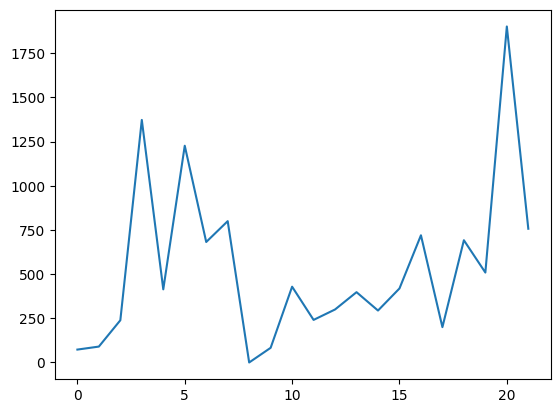

In [21]:
df.query('client_id==135405').reset_index()['consommation_level_sum'].plot()

In [74]:
dfe0 = df.query("counter_type == 'ELEC' & target == 0").groupby(['invoice_date'])[['consommation_level_sum']].mean().rolling(window=90, min_periods=1).mean().reset_index()
dfe1 = df.query("counter_type == 'ELEC' & target == 1").groupby(['invoice_date'])[['consommation_level_sum']].mean().rolling(window=90, min_periods=1).mean().reset_index()

In [75]:
df.query("counter_type == 'ELEC' & target == 1").sample()

,client_id,invoice_date,tarif_type,counter_number,counter_statue,counter_code,reading_remarque,counter_coefficient,consommation_level_1,consommation_level_2,...,day_name,day_num,day_of_year,month_year,disrict,client_catg,region,creation_date,target,consommation_level_sum
2252410,train_Client_39469,2008-01-25,11,848570,0,203,6,1,370,0,...,Friday,5,25,2008-01,63,11,311,1990-05-07,1.0,370


In [30]:
sample_e1 = df.query("counter_type == 'ELEC' & year >= 2007  & client_id == 'train_Client_120162'")[['invoice_date','consommation_level_sum']].sort_values('invoice_date')

ratio = pd.merge(dfe0, sample_e1, on='invoice_date', how='inner').eval("c_ratio=consommation_level_sum_y / consommation_level_sum_x")[['invoice_date','c_ratio' ]]
#px.line(date_unwind(ratio, 'invoice_date')[['year', 'c_ratio']].groupby('year').mean().reset_index(), x='year', y='c_ratio')

print(date_unwind(ratio, 'invoice_date')[['year', 'c_ratio']].query("year<2016")['c_ratio'].mean())
print(date_unwind(ratio, 'invoice_date')[['year', 'c_ratio']].query("year>=2016")['c_ratio'].mean())

0.671429240269
0.630667010865037


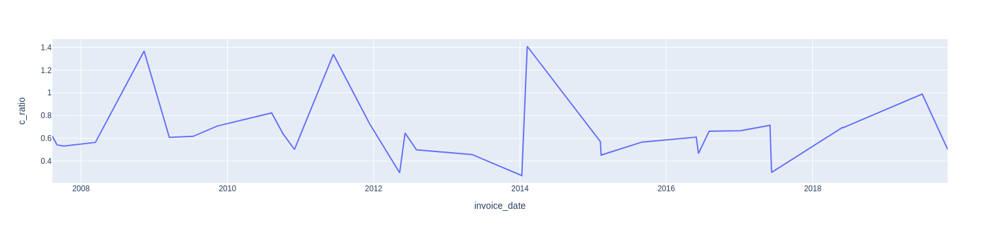

In [31]:
px.line(ratio, x='invoice_date', y='c_ratio')

In [35]:

sample_e1

,invoice_date,consommation_level_sum
746263,2007-08-11,411
746286,2007-09-03,361
746280,2007-10-07,365
746310,2008-03-13,380
746279,2008-11-11,924
746282,2009-03-17,420
746284,2009-07-14,426
746244,2009-11-11,495
746248,2010-08-10,559
746304,2010-10-06,438


In [4]:

dfe = df.query("counter_type == 'ELEC'")
dfg = df.query("counter_type == 'GAZ'")

dfe0=dfe.query('target == 0').groupby(['invoice_date'])[['consommation_level_sum']].mean().rolling(window=183, min_periods=1).mean().reset_index()
dfe1=dfe.query('target == 1').groupby(['invoice_date'])[['consommation_level_sum']].mean().rolling(window=183, min_periods=1).mean().reset_index()

dfg0=dfg.query('target == 0').groupby(['invoice_date'])[['consommation_level_sum']].mean().rolling(window=183, min_periods=1).mean().reset_index()
dfg1=dfg.query('target == 1').groupby(['invoice_date'])[['consommation_level_sum']].mean().rolling(window=183, min_periods=1).mean().reset_index()

In [5]:
dfg1.sample(10)

,invoice_date,consommation_level_sum
1217,2010-10-13,230.454285
80,2005-11-24,163.672096
1741,2013-01-28,181.574979
2047,2014-05-11,243.537842
3196,2019-06-20,222.184687
121,2006-02-08,217.302729
1438,2011-10-02,243.166095
56,2005-10-11,171.434135
36,2005-08-26,184.573773
1753,2013-02-13,173.328403


## Data Understanding

In [28]:
#compare size of the various datasets
print(client_train.shape, invoice_train.shape, client_test.shape, invoice_test.shape)
print(df.shape, dfe.shape, dfg.shape)

(135493, 6) (4476749, 16) (58069, 5) (1939730, 16)
(4476749, 21) (3079406, 21) (1397343, 21)


In [10]:
#print top rows of dataset
invoice_train.sample(3)

,client_id,invoice_date,tarif_type,counter_number,counter_statue,counter_code,reading_remarque,counter_coefficient,consommation_level_1,consommation_level_2,consommation_level_3,consommation_level_4,old_index,new_index,months_number,counter_type
1451934,train_Client_17484,2009-04-29,11,20130,0,207,9,1,88,0,0,0,51,139,4,ELEC
4214523,train_Client_92877,2011-03-25,11,315851,0,203,6,1,1200,184,0,0,20907,22291,4,ELEC
1940202,train_Client_30959,2008-02-12,11,385957,0,203,6,1,707,0,0,0,21392,22099,4,ELEC


In [11]:
#print top rows of dataset
client_train.sample(3)

,disrict,client_id,client_catg,region,creation_date,target
10449,69,train_Client_109400,11,106,1989-09-29,0.0
74045,62,train_Client_44695,11,310,1993-03-31,0.0
110940,60,train_Client_77900,11,101,1980-10-23,1.0


In [12]:
df.sample(3)

,client_id,invoice_date,tarif_type,counter_number,counter_statue,counter_code,reading_remarque,counter_coefficient,consommation_level_1,consommation_level_2,...,consommation_level_4,old_index,new_index,months_number,counter_type,disrict,client_catg,region,creation_date,target
1538159,train_Client_19845,2019-05-07,11,444868,0,203,6,1,227,0,...,0,17674,17901,4,ELEC,63,11,313,2000-02-29,0.0
3188945,train_Client_65036,2017-08-06,40,6896130,0,5,9,1,2,0,...,0,327,329,4,GAZ,62,11,304,2008-07-22,0.0
742802,train_Client_120080,2012-12-01,11,187970,0,207,6,1,1074,0,...,0,40970,42044,4,ELEC,60,11,101,1998-06-23,0.0


In [29]:
dfe.dtypes

client_id                       object
invoice_date            datetime64[ns]
tarif_type                       int64
counter_number                   int64
counter_statue                  object
counter_code                     int64
reading_remarque                 int64
counter_coefficient              int64
consommation_level_1             int64
consommation_level_2             int64
consommation_level_3             int64
consommation_level_4             int64
old_index                        int64
new_index                        int64
months_number                    int64
counter_type                    object
disrict                          int64
client_catg                      int64
region                           int64
creation_date           datetime64[ns]
target                         float64
dtype: object

In [30]:
dfe.sample(10)

,client_id,invoice_date,tarif_type,counter_number,counter_statue,counter_code,reading_remarque,counter_coefficient,consommation_level_1,consommation_level_2,...,consommation_level_4,old_index,new_index,months_number,counter_type,disrict,client_catg,region,creation_date,target
179645,train_Client_104831,2013-11-22,11,58035,0,207,6,1,634,0,...,0,8408,9042,4,ELEC,69,11,104,2008-10-23,0.0
3265202,train_Client_67109,2009-07-13,10,810720,0,202,6,1,200,38,...,0,31465,31703,4,ELEC,62,11,301,1989-08-21,0.0
1642017,train_Client_2273,2006-07-03,10,1006342,0,202,6,1,200,175,...,0,17302,17677,4,ELEC,60,11,101,1991-06-28,0.0
3806681,train_Client_81814,2013-11-22,11,867851,0,203,9,1,571,0,...,0,21743,22314,4,ELEC,63,11,312,1990-04-11,0.0
1031043,train_Client_127965,2006-10-25,29,816671,0,410,6,1,0,0,...,0,70,70,8,ELEC,62,11,304,1979-08-22,0.0
2529494,train_Client_47042,2009-06-25,11,697037,0,410,6,1,1160,0,...,0,22540,23700,12,ELEC,62,11,304,1977-09-27,0.0
999466,train_Client_127110,2018-11-26,11,603713,0,207,9,1,495,0,...,0,56575,57070,4,ELEC,63,11,312,1986-12-15,0.0
932681,train_Client_125340,2018-07-13,11,2175706712000,0,203,9,1,537,0,...,0,498,1035,4,ELEC,62,11,307,2006-10-09,0.0
1904811,train_Client_2997,2010-03-24,11,119153,0,207,8,1,307,0,...,0,526,833,4,ELEC,62,11,301,2007-03-07,0.0
2965908,train_Client_58928,2015-10-27,29,38398,0,410,9,1,899,0,...,0,70091,70990,4,ELEC,60,11,101,2007-12-24,0.0


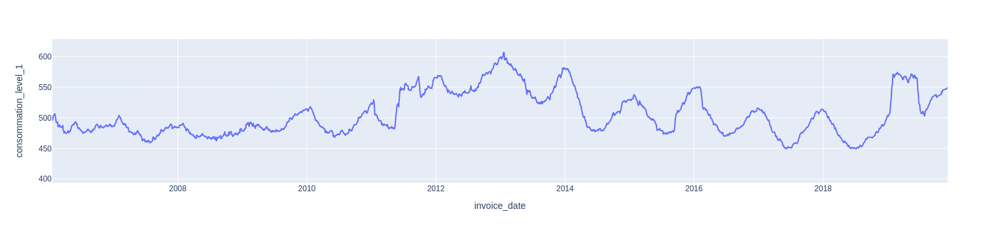

In [14]:

px.line(dfe0,x='invoice_date',y='consommation_level_1',markers=False )

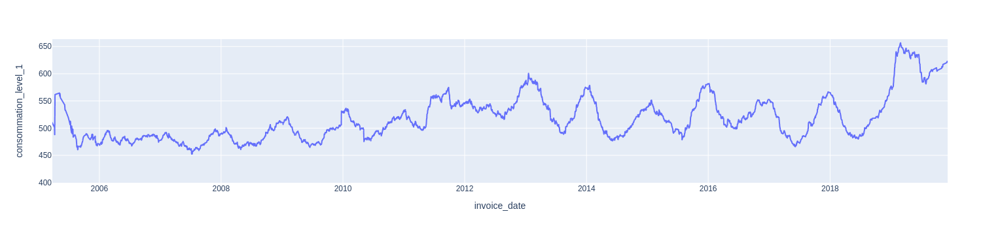

In [15]:

px.line(dfe1,x='invoice_date',y='consommation_level_1',markers=False )

### It seems like the electricity-fraudsters suddenly increased their consumption from average to >~10% above average starting from 2016 (drift). 

(first hypothesis: customers who increased their electricity consumption from 2016 (compared to the average non-fraudsters' consumption) have a higher chance of being fraudsters)

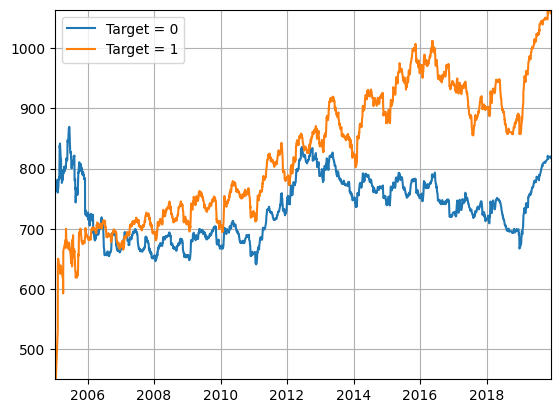

In [36]:
plt.plot(dfe0.set_index('invoice_date')[['consommation_level_sum']], label='Target = 0')
plt.plot(dfe1.set_index('invoice_date')[['consommation_level_sum']], label='Target = 1')
plt.xlim([dfe1['invoice_date'].min(),dfe1['invoice_date'].max()])
plt.ylim([450,dfe1['consommation_level_sum'].max()])
plt.grid()
plt.legend()

In [52]:
dfe0

,invoice_date,consommation_level_sum,consommation_level_sum_prev
0,1977-06-09,47.000000,NaN
1,1977-06-16,23.500000,47.000000
2,1977-06-23,20.666667,23.500000
3,1977-08-11,56.750000,20.666667
4,1977-08-23,73.800000,56.750000
...,...,...,...
8263,2019-12-02,820.072003,818.802602
8264,2019-12-03,819.839792,820.072003
8265,2019-12-04,819.193508,819.839792
8266,2019-12-06,818.007434,819.193508


,invoice_date,consommation_level_sum,consommation_level_sum_prev
4856,2005-01-07,773.494259,773.916469
4857,2005-01-08,775.800128,773.494259
4858,2005-01-09,777.083360,775.800128
4859,2005-01-11,776.132934,777.083360
4860,2005-01-12,767.618929,776.132934
...,...,...,...
8263,2019-12-02,820.072003,818.802602
8264,2019-12-03,819.839792,820.072003
8265,2019-12-04,819.193508,819.839792
8266,2019-12-06,818.007434,819.193508


### Drift calculation (see https://unofficed.com/courses/mastering-algotrading-beginners-guide-nsepython/lessons/daily-drift/ )

In [64]:
dfe1['consommation_level_sum_prev']=dfe1.consommation_level_sum.shift(1)
dfe1.query("invoice_date>= '2005-01-07'").eval("(consommation_level_sum-consommation_level_sum_prev)/consommation_level_sum_prev").mean()

0.00041180473382503155

In [65]:
dfe0['consommation_level_sum_prev']=dfe0.consommation_level_sum.shift(1)
dfe0.query("invoice_date>= '2005-01-07'").eval("(consommation_level_sum-consommation_level_sum_prev)/consommation_level_sum_prev").mean()

2.31984057830564e-05

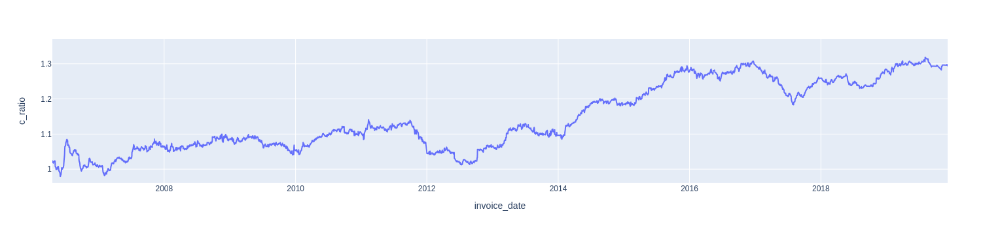

In [7]:
px.line(pd.merge(dfe0, dfe1, on='invoice_date', how='inner').eval("c_ratio=consommation_level_sum_y / consommation_level_sum_x"), x='invoice_date', y='c_ratio')

In [29]:
plt.plot(dfg0.set_index('invoice_date')[['consommation_level_1']], label='Target = 0')
plt.plot(dfg1.set_index('invoice_date')[['consommation_level_1']], label='Target = 1')
plt.xlim([dfg1['invoice_date'].min(),dfg1['invoice_date'].max()])
#plt.ylim([450,dfg1['consommation_level_1'].max()])
plt.grid()
plt.legend()

NameError: name 'dfg0' is not defined

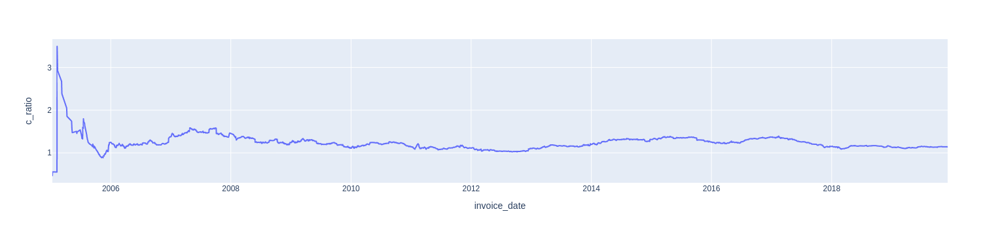

In [28]:
px.line(pd.merge(dfg0, dfg1, on='invoice_date', how='inner').eval("c_ratio=consommation_level_1_y / consommation_level_1_x"), x='invoice_date', y='c_ratio')

In [ ]:
dfe

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

In [ ]:
def date_unwind(df, datecol):
    df[datecol]  = pd.to_datetime(df[datecol])
    df['year']  = df[datecol].dt.year
    df['month'] = df[datecol].dt.month
    df['day'] = df[datecol].dt.day
    df['day_name'] = df[datecol].dt.day_name()
    df['day_num'] = df[datecol].dt.dayofweek+1
    df['day_of_year'] = df[datecol].dt.dayofyear
    df['month_year'] = df[datecol].dt.to_period('M')
    return df
    
    

In [32]:
df.columns

Index(['client_id', 'invoice_date', 'tarif_type', 'counter_number',
       'counter_statue', 'counter_code', 'reading_remarque',
       'counter_coefficient', 'consommation_level_1', 'consommation_level_2',
       'consommation_level_3', 'consommation_level_4', 'old_index',
       'new_index', 'months_number', 'counter_type', 'year', 'month', 'day',
       'day_name', 'day_num', 'day_of_year', 'month_year', 'disrict',
       'client_catg', 'region', 'creation_date', 'target',
       'consommation_level_sum'],
      dtype='object')

In [40]:
df.sample(5)

,client_id,invoice_date,tarif_type,counter_number,counter_statue,counter_code,reading_remarque,counter_coefficient,consommation_level_1,consommation_level_2,...,day_name,day_num,day_of_year,month_year,disrict,client_catg,region,creation_date,target,consommation_level_sum
4433234,train_Client_98809,2015-01-20,11,1105409,0,207,9,1,800,400,...,Tuesday,2,20,2015-01,63,11,311,1992-11-24,0.0,1444
2113202,train_Client_35650,2005-12-16,11,1232486,0,203,6,1,647,0,...,Friday,5,350,2005-12,62,11,307,1994-09-19,0.0,647
3591638,train_Client_76014,2009-12-10,11,88156,0,433,6,1,1200,3999,...,Thursday,4,344,2009-12,60,11,101,1997-10-16,0.0,5199
1783486,train_Client_26663,2007-05-29,45,18047012,0,25,6,1,6382,0,...,Tuesday,2,149,2007-05,62,51,303,1992-09-21,0.0,6382
3434835,train_Client_71743,2011-07-22,40,92151,0,5,6,1,0,0,...,Friday,5,203,2011-07,69,11,104,1983-04-13,0.0,0


In [38]:
df.query("target==0 & invoice_date>= '2005-01-07'")['consommation_level_sum'].mean()

584.7331382825043

In [249]:
df.columns

Index(['client_id', 'invoice_date', 'tarif_type', 'counter_number',
       'counter_statue', 'counter_code', 'reading_remarque',
       'counter_coefficient', 'consommation_level_1', 'consommation_level_2',
       'consommation_level_3', 'consommation_level_4', 'old_index',
       'new_index', 'months_number', 'counter_type', 'year', 'month', 'day',
       'day_name', 'day_num', 'day_of_year', 'month_year', 'disrict',
       'client_catg', 'region', 'creation_date', 'target',
       'consommation_level_sum'],
      dtype='object')

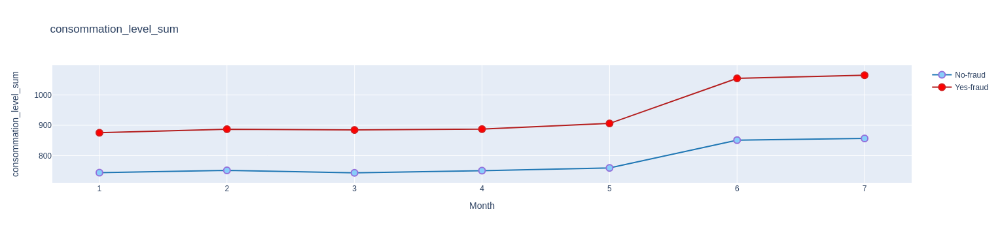

In [253]:


fig = go.Figure([
    go.Scatter(
        name='No-fraud',
        x=df.query("target==0 & invoice_date>= '2005-01-07'").groupby('day_num')['consommation_level_sum'].mean().reset_index()['day_num'],
        y=df.query("target==0 & invoice_date>= '2005-01-07'").groupby('day_num')['consommation_level_sum'].mean().reset_index()['consommation_level_sum'],
        line=dict(color='rgb(31, 119, 180)'),
        marker=dict(
            color='LightSkyBlue',
            size=10,
            line=dict(
                color='MediumPurple',
                width=2
            )
        ),
    ),
    go.Scatter(
        name='Yes-fraud',
        x=df.query("target==1 & invoice_date>= '2005-01-07'").groupby('day_num')['consommation_level_sum'].mean().reset_index()['day_num'],
        y=df.query("target==1 & invoice_date>= '2005-01-07'").groupby('day_num')['consommation_level_sum'].mean().reset_index()['consommation_level_sum'],
        line=dict(color='rgb(180, 30, 30)'),
        marker=dict(
            color='Red',
            size=10,
            line=dict(
                color='rgb(210, 30, 30)',
                width=2
            )
        ),
    )    
])
fig.update_layout(
    xaxis_title='Month',
    yaxis_title='consommation_level_sum',
    title='consommation_level_sum',
    hovermode="x"
)

fig.show()

### Are only the values from February to April of each year significant?

In [85]:
df_sum = df.query("target==0 & invoice_date>= '2005-01-07' & month >= 2 & month <=4")[['client_id', 'invoice_date', 'consommation_level_sum']].sort_values(['client_id', 'invoice_date'])
df_sum

,client_id,invoice_date,consommation_level_sum
23,train_Client_0,2006-02-24,141
28,train_Client_0,2007-02-26,182
33,train_Client_0,2010-03-29,276
18,train_Client_0,2011-03-30,497
17,train_Client_0,2012-03-27,292
...,...,...,...
4476722,train_Client_99997,2015-02-13,87
4476725,train_Client_99997,2015-02-13,351
4476720,train_Client_99997,2016-03-06,372
4476721,train_Client_99997,2016-03-06,59


In [111]:
df_test= df.query("client_id == 'train_Client_0' & invoice_date>= '2005-01-07'")

#df_test['consommation_level_sum_prev']=df_test.consommation_level_sum.shift(1)
#df_test.eval("(consommation_level_sum-consommation_level_sum_prev)/consommation_level_sum_prev").mean()


((df_test.consommation_level_sum-df_test.consommation_level_sum.shift(1))/df_test.consommation_level_sum.shift(1)).mean()



0.8809937192143498

In [112]:
def drift(x):
    return ((x-x.shift(1))/x.shift(1)).mean()


df_drift = df.query("invoice_date>= '2005-01-07'").groupby('client_id')['consommation_level_sum'].apply(drift)

KeyboardInterrupt: 

In [68]:

fig = go.Figure([
    go.Scatter(
        name='consommation_level_sum',
        x=df['day'],
        y=df['consommation_level_sum'],
        line=dict(color='rgb(31, 119, 180)'),
        marker=dict(
            color='LightSkyBlue',
            size=10,
            line=dict(
                color='MediumPurple',
                width=2
            )
        ),
    ),
])
fig.update_layout(
    xaxis_title='Day',
    yaxis_title='consommation_level_sum',
    title='consommation_level_sum',
    hovermode="x"
)

fig.show()

NameError: name 'go' is not defined

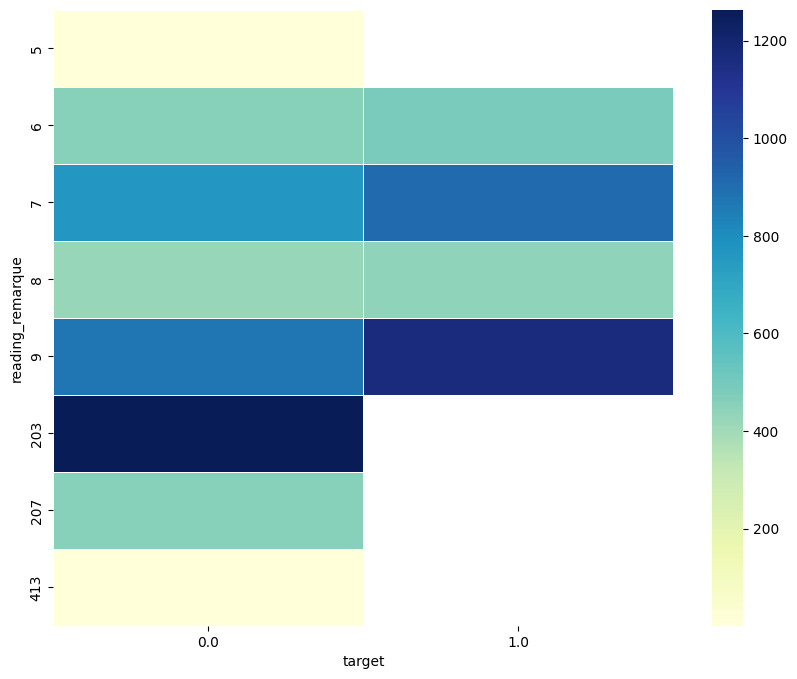

In [125]:
# check the sales across the months to understand the pattern. In this case we clearly 
# don't see gradual increase of sales for any stores over time. more or less all stores 
# are doing same business from previous months

table = pd.pivot_table(df.query("invoice_date>= '2005-01-07'"), values ='consommation_level_sum', index =['reading_remarque'], columns =['target'], aggfunc = np.mean)
fig, ax = plt.subplots(figsize=(10,8))         
sns.heatmap(table, annot=False, linewidths=.5, ax=ax, cmap="YlGnBu")
plt.show()

In [142]:
df[df['reading_remarque']==7]['target'].value_counts()

target
0.0    660
1.0      1
Name: count, dtype: int64

<Axes: xlabel='day_of_year', ylabel='consommation_level_sum'>

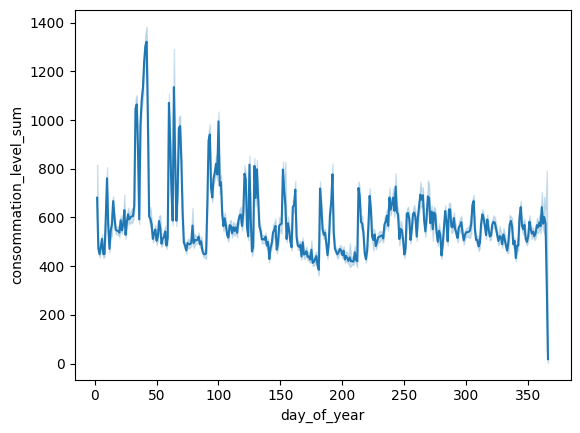

In [67]:
sns.lineplot(df, x='day_of_year', y='consommation_level_sum')

In [32]:
#Get a summary for all numerical columns
#invoice_train.describe()

In [33]:
#Get a summary for all numerical columns
#client_train.describe()

In [50]:
#Get concise information of each column in dataset
#invoice_train.info()

In [49]:
#Get concise information of each column in dataset
#client_train.info()

In [13]:
#Getting unique values on the invoice train data
for col in df.columns:
    print(f"{col} - {df[col].nunique()}")

client_id - 135493
invoice_date - 8275
tarif_type - 17
counter_number - 201893
counter_statue - 12
counter_code - 42
reading_remarque - 8
counter_coefficient - 16
consommation_level_1 - 8295
consommation_level_2 - 12576
consommation_level_3 - 2253
consommation_level_4 - 12075
old_index - 155648
new_index - 157980
months_number - 1370
counter_type - 2
disrict - 4
client_catg - 3
region - 25
creation_date - 8088
target - 2


In [36]:
#check for missing values
#invoice_train.isnull().sum()

In [37]:
#check for missing values
#client_train.isnull().sum()

No missing values in train set

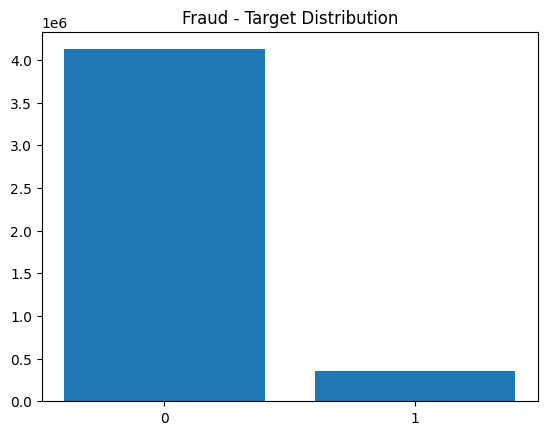

In [67]:
#Visualize fraudulent activities
fraudactivities = df.groupby(['target'])['client_id'].count()
plt.bar(x=fraudactivities.index, height=fraudactivities.values, tick_label = [0,1])
plt.title('Fraud - Target Distribution')
plt.show()

Target is highly imbalanced with fewer cases of fraudulent activities

In [68]:
df.columns

Index(['client_id', 'invoice_date', 'tarif_type', 'counter_number',
       'counter_statue', 'counter_code', 'reading_remarque',
       'counter_coefficient', 'consommation_level_1', 'consommation_level_2',
       'consommation_level_3', 'consommation_level_4', 'old_index',
       'new_index', 'months_number', 'counter_type', 'year', 'month', 'day',
       'day_name', 'day_num', 'day_of_year', 'month_year', 'disrict',
       'client_catg', 'region', 'creation_date', 'target'],
      dtype='object')

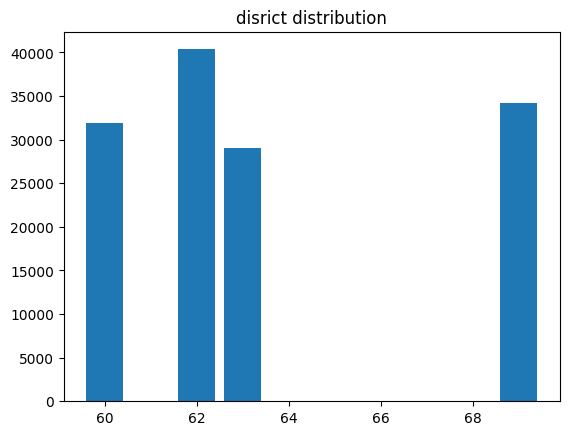

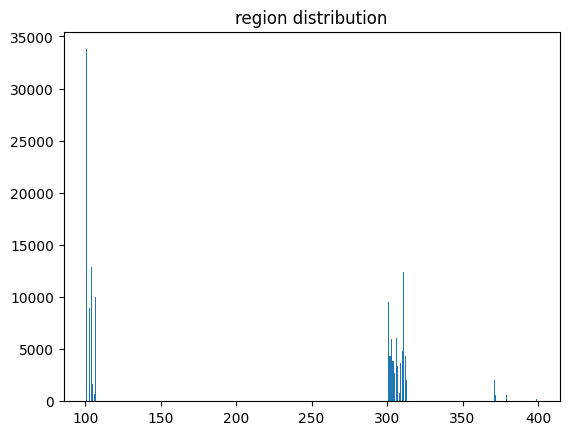

In [11]:
#Visualize client distribution across districts and regions
for col in ['disrict','region']:
    region = client_train.groupby([col])['client_id'].count()
    plt.bar(x=region.index, height=region.values)
    plt.title(col+' distribution')
    plt.show()

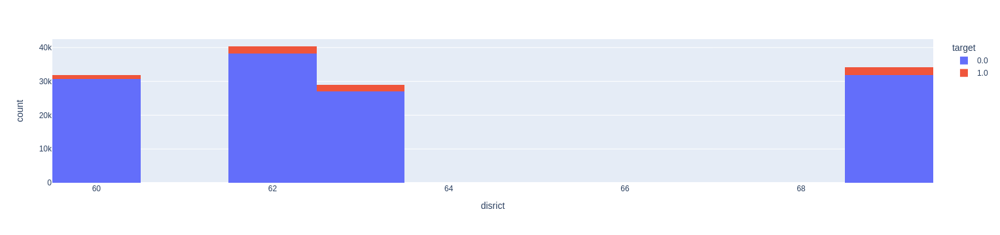

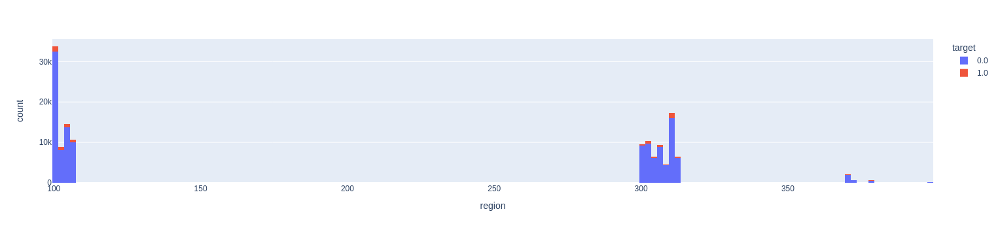

In [63]:
p1 = px.histogram(client_train, x='disrict', color='target')
p1.show()
p2 = px.histogram(client_train, x='region', color='target') #,marginal="box"
p2.show()

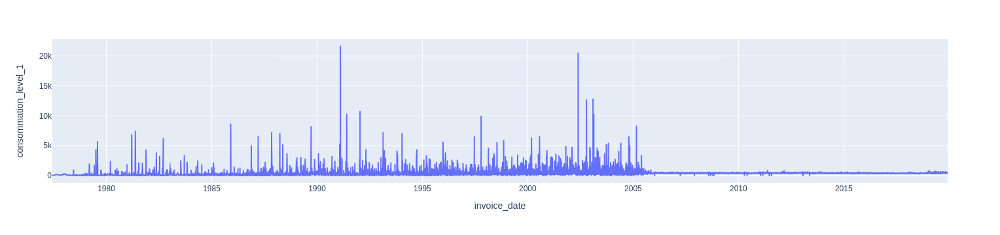

In [104]:
cl1 = invoice_train[['invoice_date', 'consommation_level_1']].groupby('invoice_date').mean().reset_index()
px.line(cl1,x='invoice_date',y='consommation_level_1' )

## Feature Engineering

In [ ]:
#convert the column invoice_date to date time format on both the invoice train and invoice test
for df in [invoice_train,invoice_test]:
    df['invoice_date'] = pd.to_datetime(df['invoice_date'])

In [ ]:
#encode labels in categorical column
d={"ELEC":0,"GAZ":1}
invoice_train['counter_type']=invoice_train['counter_type'].map(d)
invoice_test['counter_type']=invoice_test['counter_type'].map(d)

In [ ]:
#convert categorical columns to int for model
client_train['client_catg'] = client_train['client_catg'].astype(int)
client_train['disrict'] = client_train['disrict'].astype(int)

client_test['client_catg'] = client_test['client_catg'].astype(int)
client_test['disrict'] = client_test['disrict'].astype(int)

In [ ]:
def aggregate_by_client_id(invoice_data):
    aggs = {}
    aggs['consommation_level_1'] = ['mean']
    aggs['consommation_level_2'] = ['mean']
    aggs['consommation_level_3'] = ['mean']
    aggs['consommation_level_4'] = ['mean']

    agg_trans = invoice_data.groupby(['client_id']).agg(aggs)
    agg_trans.columns = ['_'.join(col).strip() for col in agg_trans.columns.values]
    agg_trans.reset_index(inplace=True)

    df = (invoice_data.groupby('client_id')
            .size()
            .reset_index(name='{}transactions_count'.format('1')))
    return pd.merge(df, agg_trans, on='client_id', how='left')

In [ ]:
#group invoice data by client_id
agg_train = aggregate_by_client_id(invoice_train)

In [ ]:
print(agg_train.shape)
agg_train.head()

(135493, 6)


,client_id,1transactions_count,consommation_level_1_mean,consommation_level_2_mean,consommation_level_3_mean,consommation_level_4_mean
0,train_Client_0,35,352.400000,10.571429,0.000000,0.000000
1,train_Client_1,37,557.540541,0.000000,0.000000,0.000000
2,train_Client_10,18,798.611111,37.888889,0.000000,0.000000
3,train_Client_100,20,1.200000,0.000000,0.000000,0.000000
4,train_Client_1000,14,663.714286,104.857143,117.357143,36.714286


In [ ]:
#merge aggregate data with client dataset
train = pd.merge(client_train,agg_train, on='client_id', how='left')

In [ ]:
#aggregate test set
agg_test = aggregate_by_client_id(invoice_test)
test = pd.merge(client_test,agg_test, on='client_id', how='left')

In [ ]:
train.shape, test.shape

((135493, 11), (58069, 10))

In [ ]:
#drop redundant columns
sub_client_id = test['client_id']
drop_columns = ['client_id', 'creation_date']

for col in drop_columns:
    if col in train.columns:
        train.drop([col], axis=1, inplace=True)
    if col in test.columns:
        test.drop([col], axis=1, inplace=True)

# Modelling

In [35]:
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, roc_auc_score, roc_curve, RocCurveDisplay, classification_report
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
# bin numerical data, scale data, encode data
from sklearn.preprocessing import KBinsDiscretizer, StandardScaler, MinMaxScaler, OneHotEncoder  
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.dummy import DummyClassifier

# XGBoost model
#-------------------------------------------------------
import xgboost as xgb
from xgboost import XGBClassifier

# LGBM model
#-------------------------------------------------------
import lightgbm
from lightgbm import LGBMClassifier

## Train LGBM *Classifier*

In [23]:
df_agg['counter_statue'] = df_agg['counter_statue'].explode('mode',ignore_index=True).astype('int')
df_agg['tarif_type'] = df_agg['tarif_type'].explode('mode',ignore_index=True).astype('int')
df_agg['counter_code'] = df_agg['counter_code'].explode('mode',ignore_index=True).astype('int')
df_agg['reading_remarque'] = df_agg['reading_remarque'].explode('mode',ignore_index=True).astype('int')

In [26]:
df_agg.dtypes

client_id                         int64
tarif_type              mode      int64
counter_statue          mode      int64
counter_code            mode      int64
reading_remarque        mode      int64
counter_coefficient     mode      int64
consommation_level_1    mean    float64
consommation_level_2    mean    float64
consommation_level_3    mean    float64
consommation_level_4    mean    float64
disrict                 mode      int64
client_catg             mode      int64
region                  mode      int64
target                  mode    float64
consommation_level_sum  mean    float64
                        std     float64
                        min       int64
                        max       int64
dtype: object

In [27]:

clients= df_agg[['client_id']]
X = df_agg.drop(['client_id', 'target'], axis=1)
#X = X[['consommation_level_1', 'consommation_level_sum', 'volatility', 'region']]

y = df_agg['target']





In [28]:
X.columns

MultiIndex([(            'tarif_type', 'mode'),
            (        'counter_statue', 'mode'),
            (          'counter_code', 'mode'),
            (      'reading_remarque', 'mode'),
            (   'counter_coefficient', 'mode'),
            (  'consommation_level_1', 'mean'),
            (  'consommation_level_2', 'mean'),
            (  'consommation_level_3', 'mean'),
            (  'consommation_level_4', 'mean'),
            (               'disrict', 'mode'),
            (           'client_catg', 'mode'),
            (                'region', 'mode'),
            ('consommation_level_sum', 'mean'),
            ('consommation_level_sum',  'std'),
            ('consommation_level_sum',  'min'),
            ('consommation_level_sum',  'max')],
           )

In [29]:
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=777, test_size=0.2)

#del X,y

In [36]:
#xgb_model = xgb.XGBClassifier()
lgbm_model = LGBMClassifier()

In [38]:
#xgb_model.fit(X_train, y_train)
lgbm_model.fit(X_train, y_train)

[LightGBM] [Fatal] Do not support special JSON characters in feature name.


LightGBMError: Do not support special JSON characters in feature name.

In [32]:
#y_pred = xgb_model.predict(X_test)
y_pred = lgbm_model.predict(X_test)

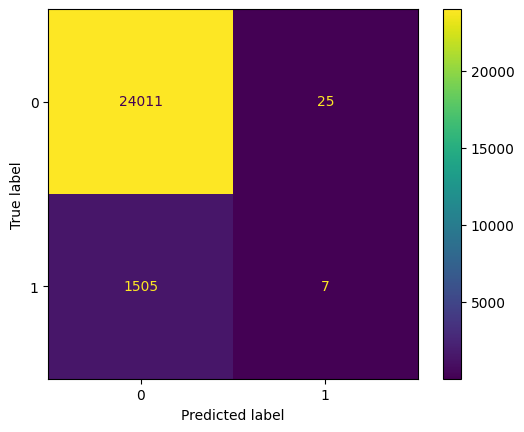

In [33]:
ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred)).plot()

In [26]:
result = X_test.copy()
result['target']=y_test
result['prediction']=y_pred

In [27]:
result.head()

,tarif_type,counter_number,counter_statue,counter_code,reading_remarque,counter_coefficient,consommation_level_1,consommation_level_2,consommation_level_3,consommation_level_4,...,month,day,day_num,day_of_year,disrict,client_catg,region,consommation_level_sum,target,prediction
1902112,11,1077817,0,207,8,1,220,0,0,0,...,2,27,1,58,69,11,103,220,0.0,0
4200353,11,508755,0,203,9,1,800,400,800,147,...,4,30,4,120,62,11,305,2147,0.0,0
1076174,11,707781,0,413,6,1,754,0,0,0,...,12,1,6,335,62,12,301,754,0.0,0
1520974,11,793893,0,203,9,1,523,0,0,0,...,10,22,4,295,62,11,301,523,0.0,0
1646467,11,776361,0,203,9,1,547,0,0,0,...,9,12,6,255,62,11,371,547,0.0,0


In [ ]:
#    xgbr_model_sku = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)


#    xgbr_model_sku.fit(X_train_sku, y_train_sku)

    # Predict on the test set

#    y_pred_sku = xgbr_model_sku.predict(X_test_sku)

## Make Predictions on test set

In [ ]:
test.columns

Index(['disrict', 'client_catg', 'region', '1transactions_count',
       'consommation_level_1_mean', 'consommation_level_2_mean',
       'consommation_level_3_mean', 'consommation_level_4_mean'],
      dtype='object')

In [ ]:
preds = model.predict(test)
preds = pd.DataFrame(preds, columns=['target'])
preds.head()

,target
0,0.0
1,0.0
2,0.0
3,0.0
4,0.0


In [ ]:
submission = pd.DataFrame(
    {
        'client_id': sub_client_id,
        'target': preds['target']
    }
)

submission.head()

,client_id,target
0,test_Client_0,0.0
1,test_Client_1,0.0
2,test_Client_10,0.0
3,test_Client_100,0.0
4,test_Client_1000,0.0


In [ ]:
submission.to_csv(f'{OUTPUT_DIR}/submission.csv', index=False)

## Tips 
- Thorough EDA and incorporating domain knowledge
- Re-grouping categorical features
- More feature engineering(try utilizing some date-time features)
- Target balancing - oversampling, undersampling, SMOTE, scale_pos_weight
- Model ensembling
- Train-test split or cross-validation


# ******************* GOOD LUCK!!! ***************************